# To be continued or discontinued: investigating secret formula for successful movie franchise
This notebook contains in-depth analysis and visualization for our project. Some figures in the blog post is taken from this notebook.

### 0 - Import Necessary Libraries

In [54]:
import base64
from IPython.display import display, HTML
import os
import json
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

import numpy as np
import pandas as pd


### 1 - Font Importation and Color Palette


In [55]:
### Imports the font in your current notebook

current_dir = os.getcwd()
font_path = os.path.join(current_dir, "src/utils/JetBrainsMono-Regular.otf")

# Read and encode the font file
with open(font_path, "rb") as font_file:
    encoded_font = base64.b64encode(font_file.read()).decode()

font_css = f"""
<style>
@font-face {{
    font-family: 'JetBrains Mono';
    src: url(data:font/otf;base64,{encoded_font});
}}
</style>
"""
display(HTML(font_css))


### Color palette
yellow_palette=["#FFEE00","#D5C923","#AAA239","#807B40","#555339","#33322B"] # goes from bright yellow to dark yellow

## Data loading and preprocessing

__Delete unused import before submission__

In [56]:
%load_ext autoreload
%autoreload 2
from collections import Counter, defaultdict

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import pandas as pd
import seaborn as sns
from wordcloud import WordCloud
#load the statistical libraries
from statsmodels.stats import diagnostic
from scipy import stats
# sklearn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# custom functions
from src.data.utils import get_franchise_movies, get_inflation_rate, get_movie, clean_character_metadata, custom_autopct, create_ethnicity_columns, get_tree_df, get_genre_counts, get_franchise_data, clean_categories, get_1_2_movies
from src.utils.plotting import plot_geo_piecharts
from src.utils.importance import run_importance
sns.set_theme(style='darkgrid', palette='colorblind', color_codes=True)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


We'll start by loading the character data and drop rows if any of the columns in `COL_FOR_DROPNA` is missing. This will make the following analysis easier without dropping too many rows (55467/395202 dropped).

__DO NOT EDIT THE LOADING ORDER OF `character_df`, `movies_df_raw`, `franchise_df` AND `movies_no_franchise_df`.__

In [57]:
COL_NAMES = [
    'Wikipedia_movie_ID', 'Freebase_movie_ID', 'Movie_release_date', 'Character_name', 
    'Actor_date_of_birth', 'Actor_gender', 'Actor_height_m', 'Actor_ethnicity_Freebase_ID', 
    'Actor_name', 'Actor_age_at_movie_release', 'Freebase_character_actor_map_ID', 
    'Freebase_character_ID', 'Freebase_actor_ID'
]
COL_FOR_DROPNA = ['Wikipedia_movie_ID', 'Freebase_movie_ID', 'Movie_release_date',
                  'Actor_gender', 'Actor_name', 'Freebase_character_actor_map_ID',
                  'Freebase_actor_ID']
RANDOM_STATE = 42

In [58]:
# load and prepare character_df
character_df = pd.read_csv('data/character.metadata.tsv', names=COL_NAMES, sep='\t')
character_df = clean_character_metadata(character_df, mapping_path='data/ethnicity_mapping.csv', columns=COL_FOR_DROPNA)

#loading the inflation rate data set from the columbia bank
inflation_rate_df=get_inflation_rate()
#loading the complete data set 
movies_df_raw = pd.read_csv('data/movie_metadata_with_tmdb.csv')
#movies_df_raw = create_ethnicity_columns(movies_df_raw, character_df)
#Data frame with all the movies with preprocessing
movies_df=get_movie(movies_df_raw,inflation_rate_df)

#loading the data set for the franchise movies 
franchise_df=get_franchise_movies(movies_df_raw,inflation_rate_df,'data/missing_dates_manualsearch.csv')
#Data frame with movies that are not part of a franchise
movies_no_franchise_df = movies_df[movies_df['collection_id'].isna()].reset_index(drop=True)

# create a new column to check if the movie is part of a franchise
character_df["is_in_franchise"] = character_df["Wikipedia_movie_ID"].isin(franchise_df["Wikipedia movie ID"])

#Data frame of only the franchise name and their characteristics
franchise_data_df = get_franchise_data(franchise_df)

# Drop franchises where any movie in the franchise does not have a release date
# franchise_df_2 = franchise_df.groupby('collection_id').filter(lambda x: x['Movie release date'].notna().all())
# print("Number of movies with all movies having release dates : ", len(franchise_df_2))

Dropping character data rows with missing values in any of ['Wikipedia_movie_ID', 'Freebase_movie_ID', 'Movie_release_date', 'Actor_gender', 'Actor_name', 'Freebase_character_actor_map_ID', 'Freebase_actor_ID'].
Number of rows dropped: 55467
395202 rows remaining.
Running sentiment analysis...


100%|██████████| 52034/52034 [00:36<00:00, 1430.87it/s]


## First look of the data

In [59]:
# Counting the number of movies per collections
franchise_counts = franchise_df.groupby(by='collection_id')['Wikipedia movie ID'].count()
# Assuming franchise_df and franchise_counts are already defined

# Step 1: Convert franchise_counts Series to DataFrame
franchise_counts_df = franchise_counts.reset_index(name='franchise_count')

# Step 2: Merge with franchise_df to add 'collection_name'
franchise_counts_df = pd.merge(franchise_counts_df, franchise_df[['collection_id', 'collection_name']].drop_duplicates(), on='collection_id', how='left')

# Display the updated franchise_counts_df
print(franchise_counts_df.head())



   collection_id  franchise_count                            collection_name
0           10.0                6                       Star Wars Collection
1           84.0                4                   Indiana Jones Collection
2          119.0                3           The Lord of the Rings Collection
3          131.0                3                    Three Colors Collection
4          151.0                6  Star Trek: The Original Series Collection


When importing the data, we decided to directly drop the franchises that had only one movie, as it would bias our analysis (it means that the other movies in the collections were not included in the dataset as they were released after 2016). 
Now, we have 1595 collections, with 5173 movies, which we deem enough. We also see a strong outlier that has 66 movies (the maximum).


boxplot_intro

In [60]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filter data to exclude outliers (e.g., values > 4)
filtered_counts = [x for x in franchise_counts if x <= 4]

# Prepare the list of outlier franchise names (this assumes that franchise_counts_df contains 'collection_name')
outlier_names = franchise_counts_df[franchise_counts_df['franchise_count'] > 4]['collection_name'].tolist()
print(outlier_names)
# Create subplots
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=(
        "Box plot of franchise sizes (with outliers)",
        "Box plot of franchise sizes (without outliers)"
    )
)

# Boxplot with outliers
fig.add_trace(
    go.Box(
        x=franchise_counts_df['franchise_count'],
        boxpoints="outliers",  # Show only outliers
        orientation="h",  # Horizontal orientation
        text=franchise_counts_df['collection_name'],  # Add franchise names as text for outliers
        hovertext=franchise_counts_df['collection_name'],  # Display the names when hovering over outliers
        hoverinfo="text"  # Display only text on hover
    ),
    row=1, col=1
)

# Boxplot without outliers (filtered data)
fig.add_trace(
    go.Box(
        x=filtered_counts,
        boxpoints=False,  # Do not show outliers
        orientation="h"  # Horizontal orientation
    ),
    row=2, col=1
)

# Update layout
fig.update_layout(
    height=600,
    width=800,
    title="Franchise Sizes",
    showlegend=False,  # Disable the legend
    hovermode="closest"  # Ensure hover text is displayed for closest point
)

# Update axis labels
fig.update_xaxes(title_text="Number of movies", row=1, col=1)
fig.update_xaxes(title_text="Number of movies", row=2, col=1)

fig.update_yaxes(showticklabels=False, row=1, col=1)
fig.update_yaxes(showticklabels=False, row=2, col=1)

# Show the plot
fig.show()


['Star Wars Collection', 'Star Trek: The Original Series Collection', 'James Bond Collection', 'Saw Collection', 'The Pink Panther (Original) Collection', 'Harry Potter Collection', 'Die Hard Collection', 'Rocky Collection', 'Planet of the Apes (Original) Collection', 'Aces Go Places Collection', 'Dr. Dolittle Collection', 'Jerry Cotton Collection', 'Highlander Collection', 'Superman Collection', 'A Nightmare on Elm Street Collection', 'Final Destination Collection', 'Hellraiser Collection', 'The Prophecy Collection', 'Police Academy Collection', 'The Fast and the Furious Collection', 'Friday the 13th Collection', 'Babylon 5 Collection', "Child's Play Collection", 'Dirty Harry Collection', 'Once Upon a Time in China Collection', 'Le Gendarme de Saint-Tropez Collection', 'Universal Soldier Collection', 'The Olsen Gang Collection', "St. Trinian's Collection", 'Herbie Collection', 'The Exorcist Collection', 'Death Wish Collection', 'Resident Evil Collection', 'The Land Before Time Collect

In [61]:
##---TO MODIFY---##
website_dir = "/Users/maylismuller/Desktop/EPFL_DOCS/Master/MA1/ADA/ada-website.github.io" ### Change to your 'ada_website' directory

graph_name = "boxplot_intro" ### Assign graph name
##---------------##

graph_json_path = website_dir + "/_includes/graphs/" + graph_name + ".json"
graph_html_path = website_dir + "/_includes/graphs/" + graph_name + ".html"
# Save the graph as JSON (this only includes the data and layout)
pio.write_json(fig, graph_json_path)

with open(graph_json_path, 'r') as json_file:
    graph_data = json.load(json_file)

# Create the minimal HTML structure with Plotly CDN
html_content = f"""
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Plotly Graph</title>
    <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
</head>
<body>
    <div id="{graph_name}" style="width: 100%; height: 500px;"></div>
    <script>
        var graphData = {json.dumps(graph_data)};
        Plotly.newPlot('{graph_name}', graphData.data, graphData.layout);
    </script>
</body>
</html>
"""

with open(graph_html_path, 'w') as html_file:
    html_file.write(html_content)

Here, we can see that at least 75% of the franchises have between 2 and 4 movies. And when looking closely at the outliers, such as "Our gang: The Roach/Pathé silents (1922-1928)" with 66 movies, we see that they mostly do not correspond to sequels, but to franchises. This is something to keep in mind for the data analysis.

## Univariate Analysis 

In this part we've investigated each column of the dataset and visualized what we are working with and compared movie in franchise and movie that aren't.

### Genres

Now, we wanted to look more closely at the genre columns, as it is one of the parameters needed to answer our research questions. First, let's plot the genre proportions in the original dataset, with all the movies. 

N.B.: most movies are defined by multiple genres and not a unique one

Now, let's compare with the distribution in the movies in franchises subset:

Now, let's compare with the distribution in the movies in franchises subset:

Now, we know that there are a lot of unique, very specific and irrelevant genres in the original categories (such as "Kitchen sink realism"), that appear less than 2% and together represent 42% of the whole genres. We therefore chose to use the ones in the added TMDB dataset.

plot_3

In [62]:
# Flatten the list of genres and count the occurrences
flattened_genres = [genre for sublist in franchise_df['genres'] for genre in sublist]
genre_counts = Counter(flattened_genres)

# Convert the Counter object to a DataFrame for easier plotting
genre_counts_df = pd.DataFrame.from_dict(genre_counts, orient='index', columns=['count']).reset_index()
genre_counts_df.columns = ['genre', 'count']

# Calculate the proportion of each genre
genre_counts_df['proportion [%]'] = genre_counts_df['count'] / genre_counts_df['count'].sum() * 100
genre_counts_df = genre_counts_df.sort_values(by='proportion [%]', ascending=False)
genre_counts_df['proportion [%]'] = genre_counts_df['proportion [%]'].apply(lambda x: round(x, 1))

# Create the pie chart
fig = go.Figure()

fig.add_trace(go.Pie(
    labels=genre_counts_df['genre'],
    values=genre_counts_df['count'],
    textinfo='percent+label',
    insidetextorientation='radial'
))

# Update layout
fig.update_layout(
    title_text="Distribution of Genres in Collections",
    title_x=0.5,  # Center the title
)

# Show the plot
fig.show()

This looks better ! And we still have the same top 3 genre ! Let's now compare our franchise movies to non franchise movies, to see if they seem to follow the same distribution:

plot_4

In [63]:
# Process franchise movies genres
flattened_genres = [genre for sublist in franchise_df['genres'] for genre in sublist]
genre_counts = Counter(flattened_genres)
genre_counts_df = pd.DataFrame.from_dict(genre_counts, orient='index', columns=['count']).reset_index()
genre_counts_df.columns = ['genre', 'count']
genre_counts_df['proportion [%]'] = genre_counts_df['count'] / genre_counts_df['count'].sum() * 100
genre_counts_df['proportion [%]'] = genre_counts_df['proportion [%]'].apply(lambda x: round(x, 1))

# Process non-franchise movies genres
nf_flattened_genres = [genre for sublist in movies_no_franchise_df['genres'] for genre in sublist]
nf_genre_counts = Counter(nf_flattened_genres)
nf_genre_counts_df = pd.DataFrame.from_dict(nf_genre_counts, orient='index', columns=['count']).reset_index()
nf_genre_counts_df.columns = ['genre', 'count']
nf_genre_counts_df['proportion [%]'] = nf_genre_counts_df['count'] / nf_genre_counts_df['count'].sum() * 100
nf_genre_counts_df['proportion [%]'] = nf_genre_counts_df['proportion [%]'].apply(lambda x: round(x, 1))

# Combine data for Plotly
genres = sorted(set(genre_counts_df['genre']).union(set(nf_genre_counts_df['genre'])))
franchise_proportions = [
    genre_counts_df.loc[genre_counts_df['genre'] == genre, 'proportion [%]'].values[0]
    if genre in genre_counts_df['genre'].values else 0
    for genre in genres
]
non_franchise_proportions = [
    nf_genre_counts_df.loc[nf_genre_counts_df['genre'] == genre, 'proportion [%]'].values[0]
    if genre in nf_genre_counts_df['genre'].values else 0
    for genre in genres
]

# Create the grouped bar chart
fig = go.Figure()

# Franchise movies bar
fig.add_trace(go.Bar(
    x=genres,
    y=franchise_proportions,
    name="Franchise Movies",
    marker_color="skyblue"
))

# Non-franchise movies bar
fig.add_trace(go.Bar(
    x=genres,
    y=non_franchise_proportions,
    name="Non-Franchise Movies",
    marker_color="orange",
    opacity=0.8
))

# Update layout
fig.update_layout(
    title="Genre Proportions: Franchise vs. Non-Franchise Movies",
    xaxis_title="Genre",
    yaxis_title="Proportion [%]",
    barmode="group",
    legend_title="Category",
    xaxis=dict(tickangle=90),
    height=600,
    width=1000
)

# Show the plot
fig.show()

### Time representation

For this part we used the released date as the main variable to analyze first the movies in the franchise collection and then the franchise as a whole

#### Distribution of the release year of movies in a franchise vs the whole CMU dataset

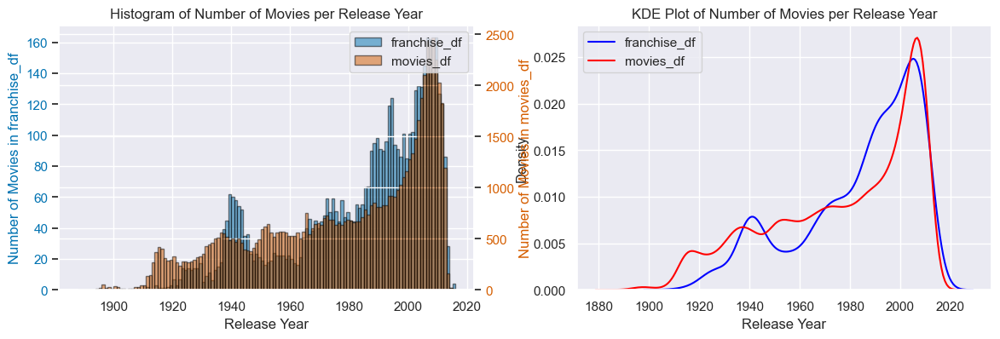

In [64]:
fig, ax = plt.subplots(1,2,figsize=(12, 4))

# Plot the histogram for franchise_df
ax[0].hist(franchise_df['release_year'].dropna(), bins=range(int(franchise_df['release_year'].min()), int(franchise_df['release_year'].max()) + 1), edgecolor='black', alpha=0.5, label='franchise_df')
ax[0].set_xlabel('Release Year')
ax[0].set_ylabel('Number of Movies in franchise_df', color='b')
ax[0].tick_params(axis='y', labelcolor='b')

# Create a second y-axis for the movies_df histogram
ax2 = ax[0].twinx()
ax2.hist(movies_df['release_year'].dropna(), bins=range(int(movies_df['release_year'].min()), int(movies_df['release_year'].max()) + 1), edgecolor='black', alpha=0.5, color='r', label='movies_df')
ax2.set_ylabel('Number of Movies in movies_df', color='r')
ax2.tick_params(axis='y', labelcolor='r')

fig.tight_layout()
plt.title('Histogram of Number of Movies per Release Year')
fig.legend(loc='upper right', bbox_to_anchor=(1,1), bbox_transform=ax[0].transAxes)


# Plot the KDE for franchise_df
sns.kdeplot(franchise_df['release_year'].dropna(), ax=ax[1], label='franchise_df', color='blue')

# Plot the KDE for movies_df
sns.kdeplot(movies_df['release_year'].dropna(), ax=ax[1], label='movies_df', color='red')

# Set labels and title
ax[1].set_xlabel('Release Year')
ax[1].set_ylabel('Density')
ax[1].set_title('KDE Plot of Number of Movies per Release Year')
ax[1].legend()

plt.show()

We observe that the subset we created from the CMU Movie dataset by extracting the franchise of at least 2 movies has more or less the same distribution of release year. Note that the CMU Movie dataset has 8% missing date. The franchise one has none since it is really necessary to know the order of the movie in a franchise, the missing release date missing were recovered.

#### Franchise length and movie release frequency

The franchise_data_df is the dataframe of all the franchise and add the different characteristics: total revenue (if all the movie have a revenue), average vote of the franchise, number of movies, oldest movie release date of the franchise, most recent release date of the franchise, length and average time between the movies in a franchise.

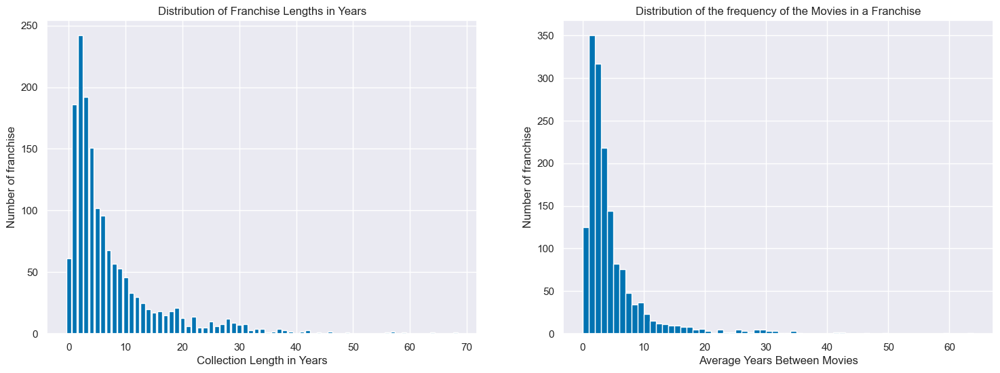

In [65]:
#Data frame of only the franchise name and their characteristics
franchise_data_df = get_franchise_data(franchise_df)

# Count the number of franchise with the same length
franchise_data_df_length = franchise_data_df['franchise_length_years'].value_counts().reset_index()
franchise_data_df_length.columns = ['franchise_length_years', 'count']

# Count the number of franchise with the same average years between movies
franchise_data_df_avbm = franchise_data_df['average_years_bt_movies'].value_counts().reset_index()
franchise_data_df_avbm.columns = ['average_years_bt_movies', 'count']
# Create bins for each year
bins = np.arange(franchise_data_df_avbm['average_years_bt_movies'].min(), franchise_data_df_avbm['average_years_bt_movies'].max() + 1, 1)

# Count the number of movie with the same year gap between the previous movie
franchise_df_ydbpm = franchise_df['years_diff_bt_pre_movies'].value_counts().reset_index()
franchise_df_ydbpm.columns = ['years_diff_bt_pre_movies', 'count']


# Plotting the bar chart
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

ax[0].bar(franchise_data_df_length['franchise_length_years'], franchise_data_df_length['count'])
ax[0].set_xlabel('Collection Length in Years')
ax[0].set_ylabel('Number of franchise')
ax[0].set_title('Distribution of Franchise Lengths in Years')

ax[1].hist(franchise_data_df['average_years_bt_movies'], bins=bins, edgecolor='white')
ax[1].set_xlabel('Average Years Between Movies')
ax[1].set_ylabel('Number of franchise')

ax[1].set_title('Distribution of the frequency of the Movies in a Franchise')
plt.show()

In [66]:
# outsiders
#franchise of more than 20 years
long_franchise = franchise_data_df[franchise_data_df['franchise_length_years'] > 20]
print(long_franchise['collection_name'])
#franchise witha an average of more than 15 years between movies
long_average = franchise_data_df[franchise_data_df['average_years_bt_movies'] > 15]
print(long_average['collection_name'])


0                   Star Wars Collection
1               Indiana Jones Collection
11                   Predator Collection
16             The Terminator Collection
19                 James Bond Collection
                      ...               
1535          Lupin The Third Collection
1556      Goin' Down the Road Collection
1568                             Khiladi
1574                Samrajyam Collection
1586    The Snake King's Wife Collection
Name: collection_name, Length: 128, dtype: object
57              The Space Odyssey Series
85       An American Werewolf Collection
123            Drunken Master Collection
145             Burnt by the Sun Trilogy
207               Wall Street Collection
                      ...               
1496                 Tom Cody Collection
1498       Debbie Does Dallas Collection
1556      Goin' Down the Road Collection
1574                Samrajyam Collection
1586    The Snake King's Wife Collection
Name: collection_name, Length: 82, dtype: object

We observe that the vast majority of the franchise are in a close range with still pretty big range. We're going to use this parameter to describe the franchise in a following part.

### Vote distribution

plot 17

In [67]:
import numpy as np
import plotly.graph_objects as go
from scipy.stats import gaussian_kde

# Filter vote_average > 0
franchise_votes = franchise_df[franchise_df['vote_average'] > 0]['vote_average'].dropna()
movies_votes = movies_df[movies_df['vote_average'] > 0]['vote_average'].dropna()

# Compute KDE for franchise_df
franchise_kde = gaussian_kde(franchise_votes)
franchise_x = np.linspace(franchise_votes.min(), franchise_votes.max(), 200)
franchise_y = franchise_kde(franchise_x)

# Compute KDE for movies_df
movies_kde = gaussian_kde(movies_votes)
movies_x = np.linspace(movies_votes.min(), movies_votes.max(), 200)
movies_y = movies_kde(movies_x)

# Calculate medians
franchise_median = np.median(franchise_votes)
movies_median = np.median(movies_votes)

# Create the plot
fig = go.Figure()

# Add franchise KDE line
fig.add_trace(go.Scatter(
    x=franchise_x, 
    y=franchise_y, 
    mode='lines', 
    name='Franchise KDE',
    line=dict(color='#2471ff'),
    hoverinfo='none'  # Remove hover information
))

# Add movies KDE line
fig.add_trace(go.Scatter(
    x=movies_x, 
    y=movies_y, 
    mode='lines', 
    name='Movies KDE',
    line=dict(color='green'),
    hoverinfo='none'  # Remove hover information
))

# Add vertical line for franchise median
fig.add_trace(go.Scatter(
    x=[franchise_median, franchise_median], 
    y=[0, max(franchise_y)], 
    mode='lines',
    line=dict(color='#2471ff', dash='dash'),
    name=f'Franchise Median: {franchise_median:.2f}',
    hoverinfo='none'  # Remove hover information
))

# Add vertical line for movies median
fig.add_trace(go.Scatter(
    x=[movies_median, movies_median], 
    y=[0, max(movies_y)], 
    mode='lines',
    line=dict(color='green', dash='dash'),
    name=f'Movies Median: {movies_median:.2f}',
    hoverinfo='none'  # Remove hover information
))

# Customize layout
fig.update_layout(
    title="KDE Plot of Average Vote for Franchise and Movies",
    xaxis_title="Average Vote",
    yaxis_title="Density",
    title_font=dict(family="JetBrains Mono", size=16, color="black"),
    xaxis=dict(title_font=dict(family="JetBrains Mono", size=14, color="black")),
    yaxis=dict(title_font=dict(family="JetBrains Mono", size=14, color="black")),
    legend=dict(
        title="Dataset",
        font=dict(family="JetBrains Mono", size=12, color="black"),
        xanchor="center",
        x=0.5,
        yanchor="top",
        y=-0.2,
        orientation="h"
    ),
    template="plotly_white",  # Clean background
    paper_bgcolor='rgba(0,0,0,0)',  # Transparent background for the entire figure
    plot_bgcolor='rgba(0,0,0,0)',  # Transparent background for the plot area
    margin=dict(l=100, r=40, t=80, b=40)  # Adjust margins for better spacing
)

# Show plot
fig.show()


We see that the Franchise movies are slightly better graded !

plot 18

In [68]:
import plotly.express as px
import pandas as pd
import numpy as np

# Sample preprocessing to calculate statistics
summary_stats = franchise_df.groupby("movie_order")["vote_average"].agg(
    mean_vote="mean",
    std_vote="std",
    ci = lambda x: 1.96 * x.std() / np.sqrt(x.count())
).reset_index()

# Create a bar plot with error bars
fig = px.bar(
    summary_stats,
    x="movie_order",
    y="mean_vote",
    error_y="ci",  # Add standard deviation as error bars
    title="Vote Average by Movie Order with Error Bars",
    labels={"movie_order": "Movie Order", "mean_vote": "Vote Average"},
    template="plotly_white"
    
)
fig.update_traces(marker=dict(color='#2471ff'))
# Customize layout
fig.update_layout(
    title="Vote Average by Movie Order",  # Set a title
    xaxis_title="Movie Order",  # Title for the X-axis
    yaxis_title="Vote Average",  # Title for the Y-axis
    yaxis=dict(range=[0, 10]),  # Limit y-axis to the range 0-10
    bargap=0.2,  # Space between bars
    font=dict(
        family="JetBrains Mono",  # Set font family
        size=15,  # Font size
        color="black",  # Font color
    ),
    template="plotly_white",  # Clean background
    margin=dict(l=100, r=40, t=80, b=40),  # Adjust margins for better spacing
    showlegend=True,
    paper_bgcolor='rgba(0,0,0,0)', # to make the background transparent
    plot_bgcolor='rgba(0,0,0,0)',
    hoverlabel=dict(
        font=dict(
            family="JetBrains Mono",  # Font family
            size=8,  # Font size
            color="#2471ff",  # Font color
        ),
        bgcolor="rgba(255, 255, 255, 0.7)",  # Background color of the hover label
        bordercolor="black",  # Border color for the hover label
        #borderwidth=1  # Border width
    )
)

# Show the plot
fig.show()


And that the second movie has a worse grade than the first !

### Countries repartition

Now, we want to focus on the franchises' countries of origin (using the tmdb dataset), and look at how they interact. First we plotted a pie chart to get a first look at which countries are most respresented in the dataset.

plot_7_2

In [69]:

from plotly.subplots import make_subplots
import plotly.graph_objects as go

def plot_geo_piecharts(movie_df, franchise_df, movies_no_franchise_df):
    # Process the list of countries for franchise movies
    list_of_countries = franchise_df.tmdb_origin_country.fillna('')
    for i in range(len(list_of_countries)):
        list_of_countries.iloc[i] = list_of_countries.iloc[i].strip("[]").replace("'", "").split(", ")

    # Flatten the list of countries and count occurrences
    country_counts = list_of_countries.explode().value_counts().drop("")

    # Group the counts of countries outside the top 7 into 'Others'
    top_countries = country_counts.nlargest(7)
    other_countries_count = country_counts.iloc[7:].sum()
    top_countries['Others'] = other_countries_count

    # Process the list of countries for non-franchise movies
    list_of_countries_non_fr = movies_no_franchise_df.tmdb_origin_country.fillna('')
    for i in range(len(list_of_countries_non_fr)):
        list_of_countries_non_fr.iloc[i] = list_of_countries_non_fr.iloc[i].strip("[]").replace("'", "").split(", ")

    # Flatten the list of countries and count occurrences
    country_counts_non_fr = list_of_countries_non_fr.explode().value_counts().drop("")

    # Group the counts of countries outside the top 7 into 'Others'
    top_countries_non_fr = country_counts_non_fr.nlargest(7)
    other_countries_count_non_fr = country_counts_non_fr.iloc[7:].sum()
    top_countries_non_fr['Others'] = other_countries_count_non_fr

    # Create subplots
    fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'domain'}, {'type': 'domain'}]])

    # Pie chart for franchise movies
    fig.add_trace(go.Pie(
        labels=top_countries.index,
        values=top_countries.values,
        name='Top 7 Countries in Franchise',
        hole=0.3,  # Adds a hole in the middle for a donut chart effect
        textinfo='percent+label',  # Displays percentage and country label
        hoverinfo='none',
        marker=dict(colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f'])
    ), row=1, col=1)

    # Pie chart for non-franchise movies
    fig.add_trace(go.Pie(
        labels=top_countries_non_fr.index,
        values=top_countries_non_fr.values,
        name='Top 7 Countries in Non-Franchise',
        hole=0.3,  # Adds a hole in the middle for a donut chart effect
        textinfo='percent+label',  # Displays percentage and country label
        hoverinfo='none',
        marker=dict(colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f'])
    ), row=1, col=2)

    # Update layout to arrange charts side by side
    fig.update_layout(
        title="Movies by Geography",
        title_x=0.5,
        showlegend=True,
        annotations=[
            dict(
                x=0.20,
                y=1.1,
                text="Top 7 Countries in Franchise",
                showarrow=False,
                font=dict(size=14)
            ),
            dict(
                x=0.80,
                y=1.1,
                text="Top 7 Countries in Non-Franchise",
                showarrow=False,
                font=dict(size=14)
            )
        ]
    )

    fig.show()

plot_geo_piecharts(movies_df, franchise_df, movies_no_franchise_df)


Now, let's look at how they interact: the nodes in the plot below represent how often the country is the origin of a movie, and the edges indicate that two countries are listed together as the origin countries.

In [70]:
import pandas as pd
import geopandas as gpd
import networkx as nx
import plotly.graph_objects as go
from itertools import combinations
from collections import Counter

def plot_network_with_plotly(franchise_df):
    # Step 1: Clean and Process Data
    cleaned_countries = []
    country_counts = Counter()
    # Iterate
    for movie in franchise_df['Movie countries (Freebase ID:name tuples)']:
        if pd.notnull(movie):
    # Split the country by comma and strip any extra characters
            country_list = [movie.split(":")[1].strip().replace("\"", "").replace("}", "") for movie in movie.split(",") if ":" in movie]
            country_list = ['China' if country == 'Hong Kong' else country for country in country_list]
            country_list = ['Germany' if country == 'West Germany' else country for country in country_list]
            country_list = ['Germany' if country == 'Weimar Republic' else country for country in country_list]
            country_list = ['Germany' if country == 'German Democratic Republic' else country for country in country_list]
            country_list = ['Malaysia' if country == 'Singapore' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'Kingdom of Great Britain' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'England' else country for country in country_list]
            country_list = ['Croatia' if country == 'Yugoslavia' else country for country in country_list]
            country_list = ['Czechia' if country == 'Czech Republic' else country for country in country_list]
            country_list = ['Czechia' if country == 'Czechoslovakia' else country for country in country_list]
            country_list = ['Czechia' if country == 'Federal Republic of Yugoslavia' else country for country in country_list]
            country_list = ['Russia' if country == 'Soviet Union' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'Scotland' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'Wales' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'Northern Ireland' else country for country in country_list]
            country_list = ['North Macedonia' if country == 'Republic of Macedonia' else country for country in country_list]
            country_list = ['Germany' if country == 'Nazi Germany' or country == 'German Language' else country for country in country_list]
            country_list = ['Slovakia' if country == 'Slovak Republic' else country for country in country_list]
            country_list = ['Serbia' if country == 'Bosnia and Herzegovina' else country for country in country_list]
            country_list = ['Italy' if country == 'Kingdom of Italy' else country for country in country_list]
            country_list = ['South Korea' if country == 'Korea' else country for country in country_list]
            country_list = ['France' if country == 'Monaco' else country for country in country_list]
            country_list = ['Italy' if country == 'Malta' else country for country in country_list]
            country_list = ['Croatia' if country == 'Socialist Federal Republic of Yugoslavia' else country for country in country_list]
            country_list = ['Serbia' if country == 'Serbia and Montenegro' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'Isle of Man' else country for country in country_list]
            country_list = ['Uzbekistan' if country == 'Uzbek SSR' else country for country in country_list]
            country_list = ['Palestine' if country == 'Mandatory Palestine' else country for country in country_list]
            country_list = ['Palestine' if country == 'Palestinian territories' or country == 'Palestinian Territories' else country for country in country_list]
            country_list = ['Myanmar' if country == 'Burma' else country for country in country_list]
            country_list = ['Germany' if country == 'Soviet occupation zone' else country for country in country_list]
            country_list = ['Ukraine' if country == 'Ukrainian SSR' or country == 'Ukranian SSR' else country for country in country_list]
            country_list = ['Georgia' if country == 'Georgian SSR' else country for country in country_list]
            #country_list = ['Kazakhstan' if country == 'Kazakh SSR' else country for country in country_list]
            #country_list = ['Kyrgyzstan' if country == 'Kirghiz SSR' else country for country in country_list]
            country_list = ['Congo' if country == 'Democratic Republic of the Congo' else country for country in country_list]
            country_list = ['Iraq' if country == 'Iraqi Kurdistan' else country for country in country_list]
            country_list = ['Venezuela' if country == 'Aruba' else country for country in country_list]
            country_list = ['China' if country == 'Republic of China' or country == 'Macau' else country for country in country_list]
            country_list = ['India' if country == 'Malayalam Language' else country for country in country_list]

            country_counts.update(country_list)
            cleaned_countries.append(country_list)

    country_counts_df = pd.DataFrame.from_dict(country_counts, orient='index', columns=['counts']).reset_index()
    country_counts_df.columns = ['country', 'counts']

    # Step 2: Create Pairs of Countries
    country_pairs = []
    for countries in cleaned_countries:
        if len(countries) > 1:
            country_pairs.extend(list(combinations(countries, 2)))

    # Step 3: Prepare World Map Data
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    unique_countries = set(country for countries in cleaned_countries for country in countries)

    country_coordinates = {}
    for country in unique_countries:
        country_data = world[world['name'] == country]
        if not country_data.empty:
            centroid = country_data.geometry.centroid.iloc[0]
            country_coordinates[country] = (centroid.x, centroid.y)

    # Step 4: Build the Network
    G = nx.Graph()
    for country, (x, y) in country_coordinates.items():
        G.add_node(country, pos=(x, y))

    for pair in country_pairs:
        G.add_edge(pair[0], pair[1])

    pos = nx.get_node_attributes(G, 'pos')

    # Step 5: Convert Network Data to Plotly
    edge_x, edge_y = [], []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    edge_trace = go.Scattergeo(
        lon=edge_x,
        lat=edge_y,
        mode='lines',
        line=dict(width=0.5, color='gray'),
        hoverinfo='none'
    )

    node_x, node_y, node_size, node_text = [], [], [], []
    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_size.append(country_counts[node] * 0.01)  # Adjust scaling factor if needed
        node_text.append(f"{node}: {country_counts[node]} films")

    node_trace = go.Scattergeo(
        lon=node_x,
        lat=node_y,
        mode='markers',
        marker=dict(
            size=node_size,
            color='blue',
            opacity=0.7,
            line=dict(width=0.5, color='black')
        ),
        text=node_text,
        hoverinfo='text'
    )

    # Step 6: Create and Display the Figure
    fig = go.Figure(data=[edge_trace, node_trace])
    fig.update_layout(
        title="Geographical Network of Film Industry Connections",
        title_x=0.5,
        showlegend=False,
        geo=dict(
            scope='world',
            projection_type='natural earth',
            showland=True,
            landcolor='lightgrey',
            showcountries=True
        )
    )
    fig.show()

In [71]:
import pandas as pd
import geopandas as gpd
import networkx as nx
import plotly.graph_objects as go
from itertools import combinations
from collections import Counter

def plot_network_with_plotly_normalized(franchise_df):
    # Step 1: Clean and Process Data
    cleaned_countries = []
    country_counts = Counter()
    for movie in franchise_df['Movie countries (Freebase ID:name tuples)']:
        if pd.notnull(movie):
            country_list = [movie.split(":")[1].strip().replace("\"", "").replace("}", "") for movie in movie.split(",") if ":" in movie]
            country_list = ['China' if country == 'Hong Kong' else country for country in country_list]
            country_list = ['Germany' if country == 'West Germany' else country for country in country_list]
            country_list = ['Germany' if country == 'Weimar Republic' else country for country in country_list]
            country_list = ['Germany' if country == 'German Democratic Republic' else country for country in country_list]
            country_list = ['Malaysia' if country == 'Singapore' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'Kingdom of Great Britain' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'England' else country for country in country_list]
            country_list = ['Croatia' if country == 'Yugoslavia' else country for country in country_list]
            country_list = ['Czechia' if country == 'Czech Republic' else country for country in country_list]
            country_list = ['Czechia' if country == 'Czechoslovakia' else country for country in country_list]
            country_list = ['Czechia' if country == 'Federal Republic of Yugoslavia' else country for country in country_list]
            country_list = ['Russia' if country == 'Soviet Union' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'Scotland' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'Wales' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'Northern Ireland' else country for country in country_list]
            country_list = ['North Macedonia' if country == 'Republic of Macedonia' else country for country in country_list]
            country_list = ['Germany' if country == 'Nazi Germany' or country == 'German Language' else country for country in country_list]
            country_list = ['Slovakia' if country == 'Slovak Republic' else country for country in country_list]
            country_list = ['Serbia' if country == 'Bosnia and Herzegovina' else country for country in country_list]
            country_list = ['Italy' if country == 'Kingdom of Italy' else country for country in country_list]
            country_list = ['South Korea' if country == 'Korea' else country for country in country_list]
            country_list = ['France' if country == 'Monaco' else country for country in country_list]
            country_list = ['Italy' if country == 'Malta' else country for country in country_list]
            country_list = ['Croatia' if country == 'Socialist Federal Republic of Yugoslavia' else country for country in country_list]
            country_list = ['Serbia' if country == 'Serbia and Montenegro' else country for country in country_list]
            country_list = ['United Kingdom' if country == 'Isle of Man' else country for country in country_list]
            country_list = ['Uzbekistan' if country == 'Uzbek SSR' else country for country in country_list]
            country_list = ['Palestine' if country == 'Mandatory Palestine' else country for country in country_list]
            country_list = ['Palestine' if country == 'Palestinian territories' or country == 'Palestinian Territories' else country for country in country_list]
            country_list = ['Myanmar' if country == 'Burma' else country for country in country_list]
            country_list = ['Germany' if country == 'Soviet occupation zone' else country for country in country_list]
            country_list = ['Ukraine' if country == 'Ukrainian SSR' or country == 'Ukranian SSR' else country for country in country_list]
            country_list = ['Georgia' if country == 'Georgian SSR' else country for country in country_list]
            #country_list = ['Kazakhstan' if country == 'Kazakh SSR' else country for country in country_list]
            #country_list = ['Kyrgyzstan' if country == 'Kirghiz SSR' else country for country in country_list]
            country_list = ['Congo' if country == 'Democratic Republic of the Congo' else country for country in country_list]
            country_list = ['Iraq' if country == 'Iraqi Kurdistan' else country for country in country_list]
            country_list = ['Venezuela' if country == 'Aruba' else country for country in country_list]
            country_list = ['China' if country == 'Republic of China' or country == 'Macau' else country for country in country_list]
            country_list = ['India' if country == 'Malayalam Language' else country for country in country_list]

            country_counts.update(country_list)
            cleaned_countries.append(country_list)

    # Normalize the counts
    max_count = max(country_counts.values()) if country_counts else 1
    min_count = min(country_counts.values()) if country_counts else 0
    normalized_counts = {country: (count - min_count) / (max_count - min_count) * 10 + 5 for country, count in country_counts.items()}

    country_counts_df = pd.DataFrame.from_dict(country_counts, orient='index', columns=['counts']).reset_index()
    country_counts_df.columns = ['country', 'counts']

    # Step 2: Create Pairs of Countries
    country_pairs = []
    for countries in cleaned_countries:
        if len(countries) > 1:
            country_pairs.extend(list(combinations(countries, 2)))

    # Step 3: Prepare World Map Data
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    unique_countries = set(country for countries in cleaned_countries for country in countries)

    country_coordinates = {}
    for country in unique_countries:
        country_data = world[world['name'] == country]
        if not country_data.empty:
            centroid = country_data.geometry.centroid.iloc[0]
            country_coordinates[country] = (centroid.x, centroid.y)

    # Step 4: Build the Network
    G = nx.Graph()
    for country, (x, y) in country_coordinates.items():
        G.add_node(country, pos=(x, y))

    for pair in country_pairs:
        G.add_edge(pair[0], pair[1])

    pos = nx.get_node_attributes(G, 'pos')

    # Step 5: Convert Network Data to Plotly
    edge_x, edge_y = [], []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    edge_trace = go.Scattergeo(
        lon=edge_x,
        lat=edge_y,
        mode='lines',
        line=dict(width=0.5, color='gray'),
        hoverinfo='none'
    )

    node_x, node_y, node_size, node_text = [], [], [], []
    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_size.append(normalized_counts.get(node, 5))  # Default size if no data
        node_text.append(f"{node}: {country_counts[node]} films")

    node_trace = go.Scattergeo(
        lon=node_x,
        lat=node_y,
        mode='markers',
        marker=dict(
            size=node_size,
            color='blue',
            opacity=0.7,
            line=dict(width=0.5, color='black')
        ),
        text=node_text,
        hoverinfo='text'
    )

    # Step 6: Create and Display the Figure
    fig = go.Figure(data=[edge_trace, node_trace])
    fig.update_layout(
        title="Geographical Network of Film Industry Connections",
        title_x=0.5,
        showlegend=False,
        geo=dict(
            scope='world',
            projection_type='natural earth',
            showland=True,
            landcolor='lightgrey',
            showcountries=True
        )
    )
    fig.show()
    return fig


plot_7 and plot_9

In [72]:
from src.utils.plotting import plot_network

plot_9 = plot_network_with_plotly_normalized(franchise_df)

# Filter out 'Republic of Macedonia' from movies_df before plotting
#filtered_movies_df = movies_df[movies_df['tmdb_origin_country'] != 'Republic of Macedonia']
# Check if filtering works as expected
#print('Republic of Macedonia' not in filtered_movies_df['tmdb_origin_country'].values, "Filtering did not remove 'Republic of Macedonia'.")

plot_7 = plot_network_with_plotly_normalized(movies_df)

In [73]:
##---TO MODIFY---##
website_dir = "/Users/maylismuller/Desktop/EPFL_DOCS/Master/MA1/ADA/ada-website.github.io" ### Change to your 'ada_website' directory

graph_name = "plot_9" ### Assign graph name
##---------------##

graph_json_path = website_dir + "/_includes/graphs/" + graph_name + ".json"
graph_html_path = website_dir + "/_includes/graphs/" + graph_name + ".html"
# Save the graph as JSON (this only includes the data and layout)
pio.write_json(plot_9, graph_json_path)

with open(graph_json_path, 'r') as json_file:
    graph_data = json.load(json_file)

# Create the minimal HTML structure with Plotly CDN
html_content = f"""
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Plotly Graph</title>
    <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
</head>
<body>
    <div id="{graph_name}" style="width: 100%; height: 500px;"></div>
    <script>
        var graphData = {json.dumps(graph_data)};
        Plotly.newPlot('{graph_name}', graphData.data, graphData.layout);
    </script>
</body>
</html>
"""

with open(graph_html_path, 'w') as html_file:
    html_file.write(html_content)

In [74]:
##---TO MODIFY---##
website_dir = "/Users/maylismuller/Desktop/EPFL_DOCS/Master/MA1/ADA/ada-website.github.io" ### Change to your 'ada_website' directory

graph_name = "plot_7" ### Assign graph name
##---------------##

graph_json_path = website_dir + "/_includes/graphs/" + graph_name + ".json"
graph_html_path = website_dir + "/_includes/graphs/" + graph_name + ".html"
# Save the graph as JSON (this only includes the data and layout)
pio.write_json(plot_7, graph_json_path)

with open(graph_json_path, 'r') as json_file:
    graph_data = json.load(json_file)

# Create the minimal HTML structure with Plotly CDN
html_content = f"""
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Plotly Graph</title>
    <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
</head>
<body>
    <div id="{graph_name}" style="width: 100%; height: 500px;"></div>
    <script>
        var graphData = {json.dumps(graph_data)};
        Plotly.newPlot('{graph_name}', graphData.data, graphData.layout);
    </script>
</body>
</html>
"""

with open(graph_html_path, 'w') as html_file:
    html_file.write(html_content)

### Actor identity analysis

In this part, we will particularly tackle Q2-3 of our research questions. That is:

> 2-3: Do actors of certain ethnicity/gender groups appear more or less commonly in franchise movies? Are they depicted positively (hero/heroine) or negatively (villain) in the movie?

#### Actor gender distribution
To begin with, we'll look at actor gender distribution of franchise and non-franchise movies.

plot_11

In [75]:
# Calculate the proportion of each gender for character_df
gender_proportion_non_fr = character_df[~character_df['is_in_franchise']]['Actor_gender'].value_counts()
# Calculate the proportion of each gender for fr_character_df
gender_proportion_franchise = character_df[character_df["is_in_franchise"]]['Actor_gender'].value_counts()

# Create subplots
fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'domain'}, {'type': 'domain'}]])

# Pie chart for franchise movies
fig.add_trace(go.Pie(
    labels=gender_proportion_franchise.index,
    values=gender_proportion_franchise.values,
    marker_line=dict(color='black', width=1),
    marker=dict(colors=["rgba(0, 0, 0, 0)", "#2471ff"]),
    pull=[0, 0.1],               #pull is the distance between the slices (to move them apart)
    textinfo='percent',          #text is what is displayed inside the plot
    textfont=dict(size=10),  
    hoverinfo='none',   #hover is what is displayed when you hover over the plot
    hoverlabel=dict(font=dict(family='Jetbrains Mono', size=8))
    ), row=1, col=1)

# Pie chart for non-franchise movies
fig.add_trace(go.Pie(
    labels=gender_proportion_non_fr.index,
    values=gender_proportion_non_fr.values,
    marker_line=dict(color='black', width=1),
    marker=dict(colors=["rgba(0, 0, 0, 0)", "#2471ff"]),
    pull=[0, 0.1],               #pull is the distance between the slices (to move them apart)
    textinfo='percent',          #text is what is displayed inside the plot
    textfont=dict(size=10),  
    hoverinfo='none',   #hover is what is displayed when you hover over the plot
    hole=0.4,                    # create the "donut" effect
), row=1, col=2)

# Update layout to arrange charts side by side
fig.update_layout(
    title="Gender Proportions in Movies",
    title_x=0.5,
    showlegend=True,
    font=dict(
        size=15,
        family="JetBrains Mono",
        color="black",
    ),
    legend=dict(
        font=dict(size=10),
        xanchor='center',
        x=0.5,
        yanchor='top',
        y=-0.1,
        orientation='h'
    ),
    paper_bgcolor='rgba(0,0,0,0)', 
    plot_bgcolor='rgba(0,0,0,0)',
    autosize=True,
    annotations=[
        dict(
            x=0.20,
            y=1.1,
            text="Non-Franchise Movies",
            showarrow=False,
            font=dict(size=14)
        ),
        dict(
            x=0.80,
            y=1.1,
            text="Franchise Movies",
            showarrow=False,
            font=dict(size=14)
        )
    ]
)

fig.show()


It seems that actor gender distribution remains the same for franchise and non-franchise movies. This is unsurprising as most of us can agree that there are particulalry many female characters in franchise movies than non-franchise movies, at least anecdotally.

#### Racial group
Next, we shift our focus to ethnicity groups. Contrary to actor gender information, actor ethnicity is not available for the majority of actors (available for 99719/395202 $\approx$ 25.2%). Upon observing the dataset, we hypothesized that the actors with known ethnicity are those with more publicity and therefore, more likely to play main roles in the movies. The ethnicity distribution of these main actors can be representative of which racial group is more or less featured in the movie. Bearing this in mind, we will proceed to visualize actors' racial group distribution for franchise and non-franchise movies.

plot_12

In [76]:
import plotly.graph_objects as go
import pandas as pd

# Calculate the percentage of each racial group for franchise and non-franchise movies
racial_proportion_franchise = character_df[character_df["is_in_franchise"]].value_counts("racial_group")
racial_proportion_non_franchise = character_df[~character_df['is_in_franchise']].value_counts("racial_group")
percentage_fr = (racial_proportion_franchise / racial_proportion_franchise.sum()) * 100
percentage_non_fr = (racial_proportion_non_franchise / racial_proportion_non_franchise.sum()) * 100
fr_count = racial_proportion_franchise.sum()
non_fr_count = racial_proportion_non_franchise.sum()

# Create the figure with two subplots side by side
fig = go.Figure()

# Plot for franchise movies
fig.add_trace(go.Bar(
    y=percentage_fr.index,
    x=percentage_fr.values,
    orientation='h',
    marker_line=dict(color='black', width=1),
    name=f'Franchise Movies',
    marker=dict(color='#2471ff'),
    text=[f'{val:.2f}%' for val in percentage_fr.values],  # Show percentage on hover
    hoverinfo='none'
))

# Plot for non-franchise movies
fig.add_trace(go.Bar(
    y=percentage_non_fr.index,
    x=percentage_non_fr.values,
    orientation='h',
    marker_line=dict(color='black', width=1),
    name=f'Non-Franchise Movies',
    marker=dict(color='rgba(0, 0, 0, 0)', line=dict(color='black', width=1)),
    text=[f'{val:.2f}%' for val in percentage_non_fr.values],  # Show percentage on hover
    hoverinfo='none',
))

# Update layout for side-by-side bars
fig.update_layout(
    title="Racial Group Distribution Comparison",
    barmode='group',
    xaxis=dict(
        title="Percentage [%]",
        range=[0, 55],  # Set x-axis range to be consistent
    ),
    yaxis=dict(
        title="Racial Group",
        autorange="reversed",  # Reverse the y-axis so the top groups appear first
    ),
    font=dict(
        size=15,
        family="JetBrains Mono",
        color="black",
    ),
    template="plotly_white",
    legend=dict(
        font=dict(size=10),
        xanchor='center',
        x=0.5,
        yanchor='top',
        y=-0.3,
        orientation='h'
    ),
    showlegend=True,
    margin=dict(l=100, r=40, t=80, b=40),  # Adjust margins for better spacing
    paper_bgcolor='rgba(0,0,0,0)', # to make the background transparent
    plot_bgcolor='rgba(0,0,0,0)'
)

# Show the plot
fig.show()


The percentages in each of the plots above sum up to 100%. Notice that compared to non-franchise movies, franchise movies have fewer percentage of Asian actors (Franchise: 14.78%, Non-franchise: 31.18%). If we compared this to the 4 pie charts from `Countries repartition` section, the two pie charts on the righthand side of the figure show that the proporitions of movies from Asia (excluding Russia, Oceania and Middle East) in franchise and non-franchise movies are not as different as the disparity observed earlie in Asian actor percentages.

This means that the disparity in the percentage of Asian actors comes from factors other than the movie production location. It is hard to identify the exact cause for this from our analysis only, but a potential confounding factor can be difference in genres: perhaps certain movie genres are more likely to be franchised which are underrepresented by Asian actors.

#### Sentimental analysis

Comment for word cloud - what are the typical adjectives used to positively or negatively describe the character?

plot_30

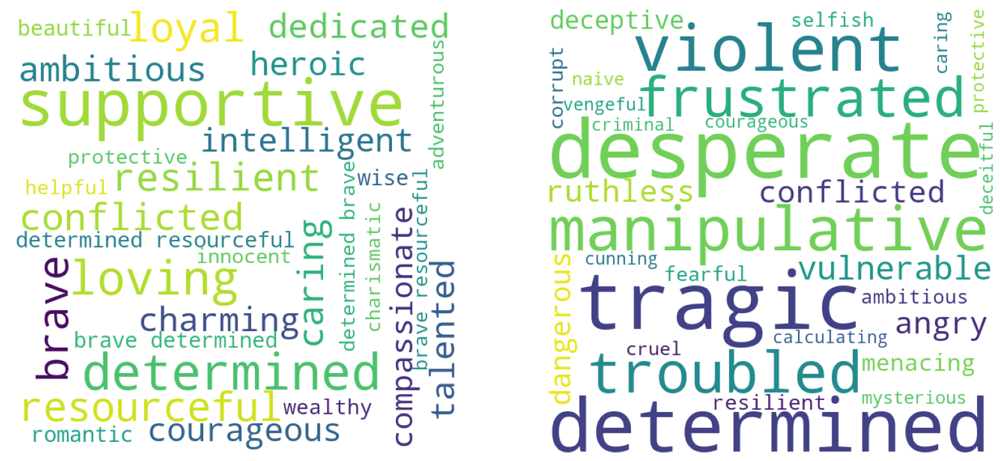

<Figure size 640x480 with 0 Axes>

In [77]:
csfont = {'fontname':'JetBrains Mono'}
# Generate text for positive and negative sentiment scores
positive_text = ",".join(character_df[character_df.sentiment_score > 0.1].Adjectives)
negative_text = ",".join(character_df[character_df.sentiment_score < -0.1].Adjectives)

# Create word clouds
positive_wordcloud = WordCloud(width=600, height=600, background_color='white',
                               min_font_size=10, max_words=30).generate(positive_text)
negative_wordcloud = WordCloud(width=600, height=600, background_color='white',
                               min_font_size=10, max_words=30).generate(negative_text)

# Plot the word clouds side by side
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

axes[0].imshow(positive_wordcloud)
#axes[0].set_title('Positive Adjectives', fontsize=30, fontweight='bold', **csfont)
axes[0].axis('off')

axes[1].imshow(negative_wordcloud)
#axes[1].set_title('Negative Adjectives', fontsize=30, fontweight='bold')
axes[1].axis('off')

plt.show()
#### retirer titre + background filling 0
plt.savefig("data/images/plot_30.png")

Box plot - no racial group stands out in terms of distribution.

plot 14

In [78]:
import plotly.express as px
import pandas as pd

# Sample DataFrame, assuming character_df exists
filtered_df = character_df[character_df.is_in_franchise].dropna(subset=['sentiment_score'])

# Count of movies with non-null sentiment scores
movie_count = len(character_df.dropna(subset=['sentiment_score']))

# Create the box plot
fig = px.box(
    filtered_df,
    x='racial_group',
    y='sentiment_score',
    title=f'Sentiment Scores by Racial Group (total: {movie_count})',
    hover_data={'racial_group': False, 'sentiment_score': True}  # Disable hover for racial_group and enable for sentiment_score
)

# Update the appearance of the box plot
fig.update_traces(
    marker=dict(color='#2471ff')  # Color for the boxes
)

# Customize the hover label appearance
fig.update_layout(
    hoverlabel=dict(
        font=dict(family='JetBrains Mono', size=8),  # Customize hover font
    ),
    xaxis_title='Racial Group',
    yaxis_title='Sentiment Score',
    xaxis_tickangle=-45,
    paper_bgcolor='rgba(0,0,0,0)',  # Transparent background
    plot_bgcolor='rgba(0,0,0,0)',   # Transparent plot background
    font=dict(
        size=15,
        family="JetBrains Mono",
        color="black",
    )
)

# Show the plot
fig.show()


### Movie revenue box office

In [79]:
franchise_revenue = franchise_df.dropna(subset=['real_revenue'])
movies_revenue = movies_df.dropna(subset=['real_revenue']) 
movies_no_franchise_revenue = movies_no_franchise_df.dropna(subset=['real_revenue'])

plot 8

In [ ]:
from plotly.subplots import make_subplots


# Create the DataFrame for revenue
all_revenue = pd.DataFrame({
    'non-franchise movies': movies_no_franchise_revenue['real_revenue'],
    'franchise movies': franchise_revenue['real_revenue'],
    'all movies': movies_revenue['real_revenue']
})

def remove_outliers(series):
    Q1 = series.quantile(0.25)  # 25th percentile
    Q3 = series.quantile(0.75)  # 75th percentile
    IQR = Q3 - Q1              # Interquartile range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return series[(series >= lower_bound) & (series <= upper_bound)]

# Remove outliers for each category
filtered_revenue = all_revenue.apply(remove_outliers)

# Create a subplot with 1 row and 2 columns
fig_combined = make_subplots(
    rows=1, cols=2, 
    subplot_titles=["With Outliers", "Without Outliers"],
    shared_yaxes=False
)

# Add the box plot with outliers to the first column
fig_combined.add_trace(go.Box(
    y=movies_no_franchise_revenue['real_revenue'],
    name='Non-Franchise Movies',
    boxpoints='outliers',
    marker=dict(color='skyblue'),
    hovertext=movies_no_franchise_revenue['Movie name'] + '<br>Revenue: ' + ((movies_no_franchise_revenue['real_revenue'] / 1e9).round(2)).astype(str) + ' B$',
    hoverinfo="text"
), row=1, col=1)

fig_combined.add_trace(go.Box(
    y=franchise_revenue['real_revenue'],
    name='Franchise Movies',
    boxpoints='outliers',
    marker=dict(color='#2471ff'),
    hovertext=franchise_revenue['Movie name'] + '<br>Revenue: ' + ((franchise_revenue['real_revenue'] / 1e9).round(2)).astype(str) + ' B$',
    hoverinfo="text"
), row=1, col=1)

fig_combined.add_trace(go.Box(
    y=movies_revenue['real_revenue'],
    name='All Movies',
    boxpoints='outliers',
    marker=dict(color='green'),
    hovertext=movies_revenue['Movie name'] + '<br>Revenue: ' + ((movies_revenue['real_revenue'] / 1e9).round(2)).astype(str) + ' B$',
    hoverinfo="text"
), row=1, col=1)

# Add the box plot without outliers to the second column
fig_combined.add_trace(go.Box(
    y=filtered_revenue['non-franchise movies'],
    name='Non-Franchise Movies',
    marker=dict(color='skyblue'),
    boxpoints=False
), row=1, col=2)

fig_combined.add_trace(go.Box(
    y=filtered_revenue['franchise movies'],
    name='Franchise Movies',
    marker=dict(color='#2471ff'),
    boxpoints=False
), row=1, col=2)

fig_combined.add_trace(go.Box(
    y=filtered_revenue['all movies'],
    name='All Movies',
    marker=dict(color='green'),
    boxpoints=False
), row=1, col=2)

# Update layout for the combined figure
fig_combined.update_layout(
    yaxis_title='Box Office Revenue [$]',
    font=dict(family="JetBrains Mono", size=14, color="black"),  # Ensure axis fonts are black
    template='plotly_white',
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    showlegend=False,
    margin=dict(l=50, r=50, t=50, b=50),  # Adjust margins for better spacing
    height=500,  # Adjust height
    width=1000,  # Adjust width
)

# Update x-axis and subplot titles
fig_combined.update_xaxes(title_text="Movie Categories", row=1, col=1)
fig_combined.update_xaxes(title_text="Movie Categories", row=1, col=2)

fig_combined.update_annotations(font=dict(family="JetBrains Mono", size=12, color="black"))

# Show the combined figure
fig_combined.show()


     Year    CPI anuel_inflation_rate
0    1800   51.0                \n \n
1    1801   50.0            \n-2.0%\n
2    1802   43.0           \n-14.0%\n
3    1803   45.0             \n4.7%\n
4    1804   45.0             \n0.0%\n
..    ...    ...                  ...
220  2020  777.7             \n1.2%\n
221  2021  814.3             \n4.7%\n
222  2022  879.4             \n8.0%\n
223  2023  915.6             \n4.1%\n
224  2024  944.9             \n3.2%\n

[225 rows x 3 columns]


### Movie budget

plot 13

In [81]:
# Create the DataFrame for revenue
all_budget = pd.DataFrame({
    'non-franchise movies': movies_no_franchise_revenue['real_budget'],
    'franchise movies': franchise_revenue['real_budget'],
    'all movies': movies_revenue['real_budget']
})

def remove_outliers(series):
    Q1 = series.quantile(0.25)  # 25th percentile
    Q3 = series.quantile(0.75)  # 75th percentile
    IQR = Q3 - Q1              # Interquartile range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return series[(series >= lower_bound) & (series <= upper_bound)]

# Remove outliers for each category
filtered_budget = all_budget.apply(remove_outliers)

# Create a subplot with 1 row and 2 columns
fig_combined = make_subplots(
    rows=1, cols=2, 
    subplot_titles=["With Outliers", "Without Outliers"],
    shared_yaxes=False
)

# Add the box plot with outliers to the first column
fig_combined.add_trace(go.Box(
    y=movies_no_franchise_revenue['real_budget'],
    name='Non-Franchise Movies',
    boxpoints='outliers',
    marker=dict(color='skyblue'),
    hovertext=movies_no_franchise_revenue['Movie name'] + '<br>Budget: ' + ((movies_no_franchise_revenue['real_budget'] / 1e9).round(2)).astype(str) + ' B$',
    hoverinfo="text"
), row=1, col=1)

fig_combined.add_trace(go.Box(
    y=franchise_revenue['real_budget'],
    name='Franchise Movies',
    boxpoints='outliers',
    marker=dict(color='#2471ff'),
    hovertext=franchise_revenue['Movie name'] + '<br>Budget: ' + ((franchise_revenue['real_budget'] / 1e9).round(2)).astype(str) + ' B$',
    hoverinfo="text"
), row=1, col=1)

fig_combined.add_trace(go.Box(
    y=movies_revenue['real_budget'],
    name='All Movies',
    boxpoints='outliers',
    marker=dict(color='green'),
    hovertext=movies_revenue['Movie name'] + '<br>Budget: ' + ((movies_revenue['real_budget'] / 1e9).round(2)).astype(str) + ' B$',
    hoverinfo="text"
), row=1, col=1)

# Add the box plot without outliers to the second column
fig_combined.add_trace(go.Box(
    y=filtered_budget['non-franchise movies'],
    name='Non-Franchise Movies',
    marker=dict(color='skyblue'),
    boxpoints=False
), row=1, col=2)

fig_combined.add_trace(go.Box(
    y=filtered_budget['franchise movies'],
    name='Franchise Movies',
    marker=dict(color='#2471ff'),
    boxpoints=False
), row=1, col=2)

fig_combined.add_trace(go.Box(
    y=filtered_budget['all movies'],
    name='All Movies',
    marker=dict(color='green'),
    boxpoints=False
), row=1, col=2)

# Update layout for the combined figure
fig_combined.update_layout(
    yaxis_title='Budget [$]',
    font=dict(family="JetBrains Mono", size=14, color="black"),  # Ensure axis fonts are black
    template='plotly_white',
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    showlegend=False,
    margin=dict(l=50, r=50, t=50, b=50),  # Adjust margins for better spacing
    height=500,  # Adjust height
    width=1000,  # Adjust width
)

# Update x-axis and subplot titles
#fig_combined.update_xaxes(title_text="Movie Categories", row=1, col=1)
#fig_combined.update_xaxes(title_text="Movie Categories", row=1, col=2)

fig_combined.update_annotations(font=dict(family="JetBrains Mono", size=12, color="black"))

# Show the combined figure
fig_combined.show()


Comparing movie revenue and budget along the movie order in a collection

plot 20

In [82]:

import pandas as pd
import plotly.graph_objects as go


# Define the function to remove outliers
def remove_outliers(series):
    Q1 = series.quantile(0.25)  # 25th percentile
    Q3 = series.quantile(0.75)  # 75th percentile
    IQR = Q3 - Q1               # Interquartile range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return series[(series >= lower_bound) & (series <= upper_bound)]

# Filter the data for movie orders <= 11
filtered_data = franchise_revenue[franchise_revenue['movie_order'] <= 11]

# Apply outlier removal to the ratio_revenue_budget column for each movie order
filtered_data['ratio_revenue_budget'] = filtered_data.groupby('movie_order')['ratio_revenue_budget'].transform(remove_outliers)

# Drop rows with NaN values created by outlier removal
filtered_data = filtered_data.dropna(subset=['ratio_revenue_budget'])

# Create a boxplot with filtered data
fig = go.Figure()

# Add box plot traces for each movie order
for order in sorted(filtered_data['movie_order'].unique()):
    fig.add_trace(go.Box(
        y=filtered_data[filtered_data['movie_order'] == order]['ratio_revenue_budget'],
        name=str(order),  # Ensure the order is treated as a category (string)
        marker_color='#2471ff',
        hoverlabel=dict(font=dict(family='Jetbrains Mono', size=8)),
        boxmean=True,
        boxpoints=False
    ))

# Update layout
fig.update_layout(
    title="Mean Ratio (Revenue/Budget) Sorted by Franchise Order (Outliers Removed)",
    xaxis=dict(
        title="Movie Order",
        categoryorder="array",  # Ensure the order of categories is consistent
        categoryarray=[str(order) for order in sorted(filtered_data['movie_order'].unique())]
    ),
    yaxis=dict(title="Ratio Revenue Over Budget"),
    font=dict(family="JetBrains Mono", size=14),
    paper_bgcolor='rgba(0,0,0,0)',  # Transparent background
    plot_bgcolor='rgba(0,0,0,0)',  # Transparent plot area
    title_x=0.5,  # Center the title
    showlegend=False,
    margin=dict(t=100)
)

# Show the plot
fig.show()


/var/folders/pk/zbd7z2k51w5_w89mv7brxxzm0000gn/T/ipykernel_91983/1644660129.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Bivariate analysis 

In this part we're going to look at the possible interaction 2 features have with another, this the first step to try to observe patterns or links.

### Movie revenue \& budget 

plot 15

In [83]:
import plotly.graph_objects as go
import pandas as pd
from plotly.subplots import make_subplots

# Calculate Pearson and Spearman correlations
pearson_corr_df = pd.DataFrame({
    'Movies': ['All Movies', 'Franchise Movies', 'Non-Franchise Movies'],
    'Pearson Correlation': [
        movies_revenue[['real_revenue', 'real_budget']].corr(method='pearson').iloc[0, 1],
        franchise_revenue[['real_revenue', 'real_budget']].corr(method='pearson').iloc[0, 1],
        movies_no_franchise_revenue[['real_revenue', 'real_budget']].corr(method='pearson').iloc[0, 1]
    ]
})

spearman_corr_df = pd.DataFrame({'Movies': ['All Movies', 'Franchise Movies', 'Non-Franchise Movies'],
    'Spearman Correlation': [
        movies_revenue[['real_revenue', 'real_budget']].corr(method='spearman').iloc[0, 1],
        franchise_revenue[['real_revenue', 'real_budget']].corr(method='spearman').iloc[0, 1],
        movies_no_franchise_revenue[['real_revenue', 'real_budget']].corr(method='spearman').iloc[0, 1]
    ]
})

# Create subplots using Plotly
fig = make_subplots(
    rows=1, cols=3,  # 1 row, 3 columns
    shared_xaxes=True  # Share the x-axis across subplots
)

# Add scatter plot for Non-Franchise Movies
fig.add_trace(go.Scatter(
    x=movies_no_franchise_revenue['real_revenue'],
    y=movies_no_franchise_revenue['real_budget'],
    mode='markers',
    name='Non-Franchise Movies',
    marker=dict(color='skyblue', opacity=0.5),
    hovertemplate=
    movies_no_franchise_revenue['Movie name']+'<br>' +
    '<b>Real Revenue:</b> %{x}<br>' +
    '<b>Real Budget:</b> %{y}<br>' +
    '<extra></extra>'  # Removes the extra info (trace name) from the hover label
), row=1, col=1)

# Add scatter plot for Franchise Movies
fig.add_trace(go.Scatter(
    x=franchise_revenue['real_revenue'],
    y=franchise_revenue['real_budget'],
    mode='markers',
    name='Franchise Movies',
    marker=dict(color='#2471ff', opacity=0.5),
    hovertemplate=
    franchise_revenue['Movie name']+'<br>' +
    '<b>Real Revenue:</b> %{x}<br>' +
    '<b>Real Budget:</b> %{y}<br>' +
    '<extra></extra>'  # Removes the extra info (trace name) from the hover label
), row=1, col=2)

fig.update_xaxes(title_text="Real Revenue [$]", row=1, col=2)

# Add scatter plot for All Movies
fig.add_trace(go.Scatter(
    x=movies_revenue['real_revenue'],
    y=movies_revenue['real_budget'],
    mode='markers',
    name='All Movies',
    marker=dict(color='green', opacity=0.5),
    hovertemplate=
    movies_revenue['Movie name']+'<br>' +
    '<b>Real Revenue:</b> %{x}<br>' +
    '<b>Real Budget:</b> %{y}<br>' +
    '<extra></extra>'  # Removes the extra info (trace name) from the hover label
), row=1, col=3)

# Manually add annotations for the titles with new lines
fig.add_annotation(
    x=0.17, y=1.05, xref="paper", yref="paper",
    text=f'Non-Franchise Movies<br>Pearson: {pearson_corr_df.iloc[0, 1]:.2f}<br>Spearman: {spearman_corr_df.iloc[0, 1]:.2f}',
    showarrow=False,
    font=dict(size=12),
    align="left"
)

fig.add_annotation(
    x=0.5, y=1.05, xref="paper", yref="paper",
    text=f'Franchise Movies<br>Pearson: {pearson_corr_df.iloc[1, 1]:.2f}<br>Spearman: {spearman_corr_df.iloc[1, 1]:.2f}',
    showarrow=False,
    font=dict(size=12),
    align="center"
)

fig.add_annotation(
    x=0.83, y=1.05, xref="paper", yref="paper",
    text=f'All Movies<br>      Pearson: {pearson_corr_df.iloc[2, 1]:.2f}<br>       Spearman: {spearman_corr_df.iloc[2, 1]:.2f}',
    showarrow=False,
    font=dict(size=12),
    align="right"
)

# Update layout to add titles and axis labels
fig.update_layout(
    title='Scatter Plots of Real Revenue vs. Real Budget',
    showlegend=False,  # Hide the legend to prevent overlapping
    template='plotly_white',  # Use a clean white background template
    font=dict(family="JetBrains Mono", size=14),
    hoverlabel=dict(font=dict(family='JetBrains Mono', size=8)),  # Customize hover font globally
    paper_bgcolor='rgba(0,0,0,0)',  # Transparent background
    plot_bgcolor='rgba(0,0,0,0)',  # Transparent plot area
    height=500,  # Set a fixed height for the entire figure
    width=1100,  # Set a fixed width for the entire figure
    yaxis=dict(title='Real Budget [$]', domain=[0, 1]),  # Position y-axis on the left
)

fig.show()


### Genre \& revenue

plot 16

In [84]:
import plotly.express as px
import pandas as pd

exploded_df = franchise_df.explode('genres').reset_index(drop=True).sort_values(by='real_revenue', ascending=False)
exploded_df = exploded_df.groupby('collection_id').filter(lambda x: x['real_revenue'].notna().all())
# Sort the genres by their average revenue
genre_revenue = exploded_df.groupby('genres')['real_revenue'].mean().sort_values(ascending=False).index
exploded_df['genres'] = pd.Categorical(exploded_df['genres'], categories=genre_revenue, ordered=True)

# Sample preprocessing to calculate statistics
summary_stats = exploded_df.groupby("genres")["real_revenue"].agg(
    mean_revenue="mean",
    std_revenue="std",
    ci = lambda x: 1.96 * x.std() / np.sqrt(x.count())
).reset_index()

# Create a bar plot with error bars
fig = px.bar(
    summary_stats,
    x="genres",
    y="mean_revenue",
    error_y="ci",  # Add standard deviation as error bars
    title="Real Revenue Depending on the Genres",
    labels={"movie_order": "Movie Order", "mean_revenue": "Real Revenue [$]"},
    
    template="plotly_white"
)
fig.update_traces(marker=dict(color='#2471ff'))
# Customize layout
fig.update_layout(
    xaxis_title="Genres",
    yaxis_title="Real Revenue [$]",
    bargap=0.2,
    font=dict(
        size=15,
        family="JetBrains Mono",
        color="black",
    ),
    template="plotly_white",
    legend=dict(
        font=dict(size=10),
        xanchor='center',
        x=0.5,
        yanchor='top',
        y=-0.3,
        orientation='h'
    ),
    showlegend=True,
    margin=dict(l=100, r=40, t=80, b=40),  # Adjust margins for better spacing
    paper_bgcolor='rgba(0,0,0,0)', # to make the background transparent
    plot_bgcolor='rgba(0,0,0,0)',
    hoverlabel=dict(
        font=dict(
            family="JetBrains Mono",  # Font family
            size=8,  # Font size
            color="#2471ff",  # Font color
        ),
        bgcolor="rgba(255, 255, 255, 0.7)",  # Background color of the hover label
        bordercolor="black",  # Border color for the hover label
        #borderwidth=1  # Border width
    )
)

# Show the plot
fig.show()

We see that Adventure, Fantasy, and Animation are the highest-grossing genres for franchise movies.

NB : If a category doesn't have a barplot, it means that there is no data. Lack of error bars means only one movie is in that category.

Now, let's look at the profit, between the first and the second movie :

plot 21

In [85]:

import plotly.graph_objects as go
import pandas as pd
import numpy as np
from scipy.stats import sem

# Step 1: Filter the data for first and second movies
f_and_s = exploded_df[exploded_df['movie_order'].isin([1.0, 2.0])]

# Step 2: Group by 'genres' and 'movie_order' to calculate mean and confidence intervals
def calculate_summary(group):
    mean = group['ratio_revenue_budget'].mean()
    ci = sem(group['ratio_revenue_budget'], ddof=0) if len(group) > 1 else 0
    return pd.Series({'mean_ratio': mean, 'ci_ratio': ci})

summary_stats = (
    f_and_s.groupby(['genres', 'movie_order'])
    .apply(calculate_summary, include_groups=False)
    .reset_index()
)

# Step 3: Separate first and second movies for easier plotting
first_movies_stats = summary_stats[summary_stats['movie_order'] == 1.0]
second_movies_stats = summary_stats[summary_stats['movie_order'] == 2.0]

# Step 4: Create the Plotly bar plot
fig = go.Figure()

# Add bars for the first movie
fig.add_trace(go.Bar(
    x=first_movies_stats['genres'],
    y=first_movies_stats['mean_ratio'],
    name='First Movie',
    marker_color='grey',
    error_y=dict(
        type='data',
        array=first_movies_stats['ci_ratio'],  # Confidence interval
        visible=True
    )
))

# Add bars for the second movie
fig.add_trace(go.Bar(
    x=second_movies_stats['genres'],
    y=second_movies_stats['mean_ratio'],
    name='Second Movie',
    marker_color='#2471ff',
    error_y=dict(
        type='data',
        array=second_movies_stats['ci_ratio'],  # Confidence interval
        visible=True
    )
))

# Step 5: Update the layout
fig.update_layout(
    title='Mean Revenue to Budget Ratio by Genre, with Confidence Intervals',
    xaxis_title='Genre',
    yaxis_title='Mean Revenue to Budget Ratio [log scale]',
    yaxis=dict(type='log'),  # Logarithmic scale
    xaxis_tickangle=-90,  # Rotate x-axis labels for readability
    barmode='group',  # Group bars for each genre
    bargap=0.3,
    template='plotly_white',  # Clean white background
    showlegend=True,
    paper_bgcolor='rgba(0,0,0,0)',  # Transparent background
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(family="JetBrains Mono", size=12),  # Custom font
    height=500,  # Fixed plot height
    margin=dict(l=100, r=40, t=80, b=40),  # Adjust margins for better spacing
    hoverlabel=dict(
        font=dict(
            family="JetBrains Mono",  # Font family
            size=8,  # Font size
            color="#2471ff",  # Font color
        ),
        bgcolor="rgba(255, 255, 255, 0.7)",  # Background color of the hover label
        bordercolor="black",  # Border color for the hover label
        #borderwidth=1  # Border width
    )
)

fig.show()


Except for thrillers, Crime, Romance and Documentaries, the first movie performs on average better than the second. Nonetheless, they were still less profitable than the first movies.

And just to be sure, let's look at the first plot again, but with the filtered data:

We see that the 8 highest-grossing genres for the entire collections are still the same !

#### Average revenue of a franchise and length of a franchise, frequency and number of movie 

In [86]:

# Calculate Pearson and Spearman correlations
pearson_corr_length = stats.pearsonr(franchise_data_df.dropna(subset=['franchise_length_years','revenue_avg'])['franchise_length_years'],franchise_data_df.dropna(subset=['franchise_length_years','revenue_avg'])['revenue_avg'])
spearman_corr_length = stats.spearmanr(franchise_data_df.dropna(subset=['franchise_length_years','revenue_avg'])['franchise_length_years'],franchise_data_df.dropna(subset=['franchise_length_years','revenue_avg'])['revenue_avg'])

pearson_corr_average = stats.pearsonr(franchise_data_df.dropna(subset=['average_years_bt_movies','revenue_avg'])['average_years_bt_movies'],franchise_data_df.dropna(subset=['average_years_bt_movies','revenue_avg'])['revenue_avg'])
spearman_corr_average = stats.spearmanr(franchise_data_df.dropna(subset=['average_years_bt_movies','revenue_avg'])['average_years_bt_movies'],franchise_data_df.dropna(subset=['average_years_bt_movies','revenue_avg'])['revenue_avg'])

pearson_corr_count = stats.pearsonr(franchise_data_df.dropna(subset=['movie_count','revenue_avg'])['movie_count'],franchise_data_df.dropna(subset=['movie_count','revenue_avg'])['revenue_avg'])
spearman_corr_count = stats.spearmanr(franchise_data_df.dropna(subset=['movie_count','revenue_avg'])['movie_count'],franchise_data_df.dropna(subset=['movie_count','revenue_avg'])['revenue_avg'])



# Create subplots with increased horizontal spacing
fig = make_subplots(
    rows=1, cols=3,  # 1 row, 3 columns
    shared_yaxes=True,  # Share the y-axis across subplots
    horizontal_spacing=0.2  # Increase space between subplots
)

# Add scatter plot for Franchise Revenue average vs Franchise Length
fig.add_trace(go.Scatter(
    x=franchise_data_df['franchise_length_years'],
    y=franchise_data_df['revenue_avg'],
    mode='markers',
    hovertemplate=
    movies_revenue['Movie name']+'<br>' +
    '<b>Franchise Length:</b> %{x}<br>' +
    '<b>Avg. Rev.:</b> %{y}<br>' +
    '<extra></extra>',
    name='Franchise Revenue average vs its Length',
    marker=dict(color='#2471ff', opacity=0.5)
), row=1, col=1)

fig.update_xaxes(title_text="Franchise Length [Years]", row=1, col=1)

# Add scatter plot for Franchise Revenue average vs Average Length between Movies
fig.add_trace(go.Scatter(
    x=franchise_data_df['average_years_bt_movies'], 
    y=franchise_data_df['revenue_avg'],
    mode='markers',
    hovertemplate=
    movies_revenue['Movie name']+'<br>' +
    '<b>Avg Years:</b> %{x}<br>' +
    '<b>Avg. Rev.:</b> %{y}<br>' +
    '<extra></extra>',
    name='Franchise Revenue average vs Average Length between Movies',
    marker=dict(color='#2471ff', opacity=0.5),
), row=1, col=2)
fig.update_xaxes(title_text="Avg. Length Between Movies [Years]", row=1, col=2)

# Add scatter plot for Franchise Revenue average vs Number of Movies
fig.add_trace(go.Scatter(
    x=franchise_data_df['movie_count'], 
    y=franchise_data_df['revenue_avg'],
    mode='markers',
    hovertemplate=
    movies_revenue['Movie name']+'<br>' +
    '<b># of Movies:</b> %{x}<br>' +
    '<b>Avg. Rev.:</b> %{y}<br>' +
    '<extra></extra>',
    name='Franchise Revenue average vs its Number of Movies',
    marker=dict(color='#2471ff', opacity=0.5),
), row=1, col=3)

fig.update_xaxes(title_text="Number of Movies", row=1, col=3)

# Update annotations for correlation values
fig.add_annotation(
    x=0.15, y=1.1, xref="paper", yref="paper",
    text=f'Pearson: {pearson_corr_length[0]:.2f}<br>Spearman: {spearman_corr_length[0]:.2f}',
    showarrow=False,
    font=dict(size=10),
    align="left"
)

fig.add_annotation(
    x=0.5, y=1.1, xref="paper", yref="paper",
    text=f'Pearson: {pearson_corr_average[0]:.2f}<br>Spearman: {spearman_corr_average[0]:.2f}',
    showarrow=False,
    font=dict(size=10),
    align="center"
)

fig.add_annotation(
    x=0.85, y=1.1, xref="paper", yref="paper",
    text=f'Pearson: {pearson_corr_count[0]:.2f}<br>Spearman: {spearman_corr_count[0]:.2f}',
    showarrow=False,
    font=dict(size=10),
    align="right"
)

# Update layout for better readability
fig.update_layout(
    title='Scatter Plots of Franchise Revenue vs Metrics',
    showlegend=False,  # Hide the legend to prevent overlapping
    template='plotly_white',  # Use a clean white background template
    font=dict(family="JetBrains Mono", size=12),
    paper_bgcolor='rgba(0,0,0,0)',  # Transparent background
    plot_bgcolor='rgba(0,0,0,0)',  # Transparent plot area
    height=400,  # Fixed height for the entire figure
    width=1000,  # Fixed width for the entire figure
    hoverlabel=dict(font=dict(family='JetBrains Mono', size=8)), 
    yaxis=dict(title='Average Revenue [$]'),  # Shared y-axis title
)

fig.show()


Note that the first movies were assigned the value -1 to differentiate them from the rest of the movies but still have them on the plot (they are not taking into account for the correlation). We observe no significant correlation for both 

### Budget/revenue & vote

plot 23

In [87]:
# Calculate the person and spearmann correlation
person_corr = franchise_df[['vote_average','real_budget','real_revenue', 'real_profit']].corr(method='pearson')
spearman_corr = franchise_df[['vote_average','real_budget','real_revenue', 'real_profit']].corr(method='spearman')

# Create subplots with increased horizontal spacing
fig = make_subplots(
    rows=1, cols=3,  # 1 row, 3 columns
    shared_yaxes=True,  # Share the y-axis across subplots
    horizontal_spacing=0.2  # Increase space between subplots
)

# Add scatter plot for Franchise Revenue average vs Franchise Length
fig.add_trace(go.Scatter(
    x=franchise_df['vote_average'],
    y=franchise_df['real_budget'],
    mode='markers',
    hovertemplate=
    movies_revenue['Movie name']+'<br>' +
    '<b>Franchise Length:</b> %{x}<br>' +
    '<b>Avg. Rev.:</b> %{y}<br>' +
    '<extra></extra>',
    #name='Budget vs Vote Average',
    marker=dict(color='#2471ff', opacity=0.5)
), row=1, col=1)
fig.update_xaxes(title_text="Budget vs Vote Average", row=1, col=1)

# Add scatter plot for Franchise Revenue average vs Average Length between Movies
fig.add_trace(go.Scatter(
    x=franchise_df['vote_average'], 
    y=franchise_df['real_revenue'],
    mode='markers',
    hovertemplate=
    movies_revenue['Movie name']+'<br>' +
    '<b>Avg Years:</b> %{x}<br>' +
    '<b>Avg. Rev.:</b> %{y}<br>' +
    '<extra></extra>',
    #name='Budget vs Vote Average',
    marker=dict(color='#2471ff', opacity=0.5),
), row=1, col=2)
fig.update_xaxes(title_text="Revenue vs Vote Average", row=1, col=2)

# Add scatter plot for Franchise Revenue average vs Number of Movies
fig.add_trace(go.Scatter(
    x=franchise_df['vote_average'], 
    y=franchise_df['real_profit'],
    mode='markers',
    hovertemplate=
    movies_revenue['Movie name']+'<br>' +
    '<b># of Movies:</b> %{x}<br>' +
    '<b>Avg. Rev.:</b> %{y}<br>' +
    '<extra></extra>',
    name='Franchise Revenue average vs its Number of Movies',
    marker=dict(color='#2471ff', opacity=0.5),
), row=1, col=3)
fig.update_xaxes(title_text="Profit vs Vote Average", row=1, col=3)

# Update annotations for correlation values
fig.add_annotation(
    x=0.15, y=1.1, xref="paper", yref="paper",
    text=f'Pearson: {person_corr.iloc[0,1]:.2f}<br>Spearman: {spearman_corr.iloc[0,1]:.2f}',
    showarrow=False,
    font=dict(size=10),
    align="left"
)

fig.add_annotation(
    x=0.5, y=1.1, xref="paper", yref="paper",
    text=f'Pearson: {person_corr.iloc[0,2]:.2f}<br>Spearman: {spearman_corr.iloc[0,2]:.2f}',
    showarrow=False,
    font=dict(size=10),
    align="center"
)

fig.add_annotation(
    x=0.85, y=1.1, xref="paper", yref="paper",
    text=f'Pearson: {person_corr.iloc[0,3]:.2f}<br>Spearman: {person_corr.iloc[0,3]:.2f}',
    showarrow=False,
    font=dict(size=10),
    align="right"
)

# Update layout for better readability
fig.update_layout(
    title='Scatter Plots of Vote Average vs Metrics',
    showlegend=False,  # Hide the legend to prevent overlapping
    template='plotly_white',  # Use a clean white background template
    font=dict(family="JetBrains Mono", size=12),
    paper_bgcolor='rgba(0,0,0,0)',  # Transparent background
    plot_bgcolor='rgba(0,0,0,0)',  # Transparent plot area
    height=400,  # Fixed height for the entire figure
    width=1000,  # Fixed width for the entire figure
    hoverlabel=dict(font=dict(family='JetBrains Mono', size=8)), 
    yaxis=dict(title='Amount [$]'),  # Shared y-axis title
)

fig.show()

Here, we see that the profit has the highest linear relationship with the vote !

## Shapley value analysis: what is the recipe for franchise movies?

In [88]:
tree_df = get_tree_df(franchise_df, movies_no_franchise_df, RANDOM_STATE)
X_train, X_test, y_train, y_test = train_test_split(tree_df.drop(columns=["in_franchise"]), tree_df["in_franchise"], test_size=0.3)
clf = HistGradientBoostingClassifier(max_iter=100, random_state=RANDOM_STATE)
clf.fit(X_train, y_train)
print("Test accuracy:", clf.score(X_test, y_test))

KeyError: "['num_Asian', 'num_Black', 'num_Hispanic', 'num_Middle Eastern', 'num_Native American', 'num_Others', 'num_White', 'female_ratio'] not in index"

In [41]:
#run_importance(clf, X_train, X_test, y_test, target_name="in_franchise", save_dir="data/shapley_result", random_state=RANDOM_STATE)

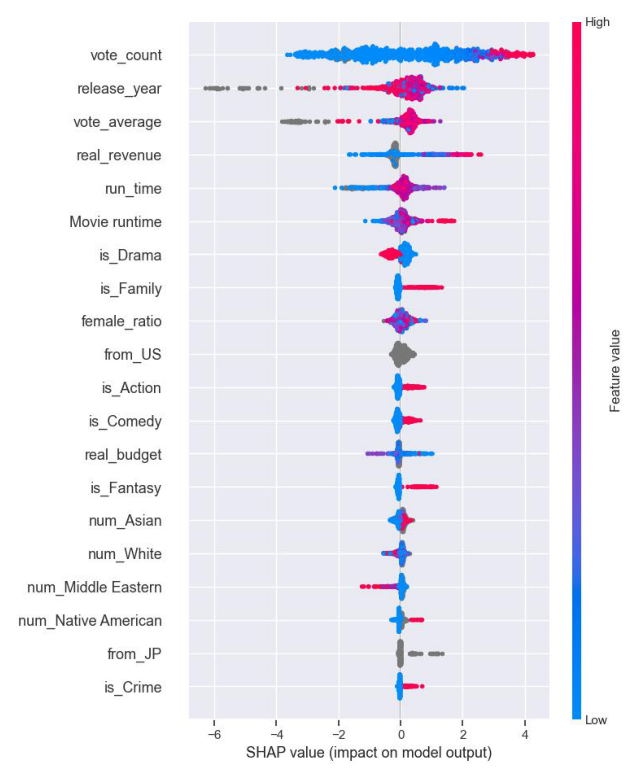

In [42]:
shap_plot = plt.imread("data/shapley_result/shap_summary_plot_in_franchise.jpg")
plt.figure(figsize=(8,10))  # Set the plot size
plt.imshow(shap_plot)
plt.axis('off')  # Hide the axis
plt.show()

# Franchise successfulness and pattern investigation

In order to find the underlying pattern in franchises (has a group of movies and not has movies in a franchise), we've used different characteristics of a franchise such has its length, the number of movies in it, the average years between the movies, the average revenue, the average budget, genre that appears in the franchise and country that are link to the franchise.

After trying to find correlation between those different characteristic and having difficulties observing patterns we're going to try a new approach to better understand the franchise dataset.

Since the franchise we have in the dataset can defer a lot from one to another, an idea to go deeper into our analysis is to try to group franchise that have features close to one another. Using the hypothesis that if franchises have features that are similar they would behave the same, then looking at those features we might be able to find interesting pattern.

To group the feature a K nearest neighbors (KNN) was used to the fit the data.

## KNN regression of franchise that have both a average revenue and a average budget

The revenue and budget of a franchise was calculated using the known values of movies in the franchise and was average on the number of movies that had a value. This was done in order to maximize the number of franchise for the analysis, but it can create a bias since its assuming that movies that don't have values must have had a similar revenue and budget.

/var/folders/pk/zbd7z2k51w5_w89mv7brxxzm0000gn/T/ipykernel_72272/2613503741.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  KNN_data_no_na.loc[:, 'Cluster'] = pd.NA  # Initialize Cluster column with NaN


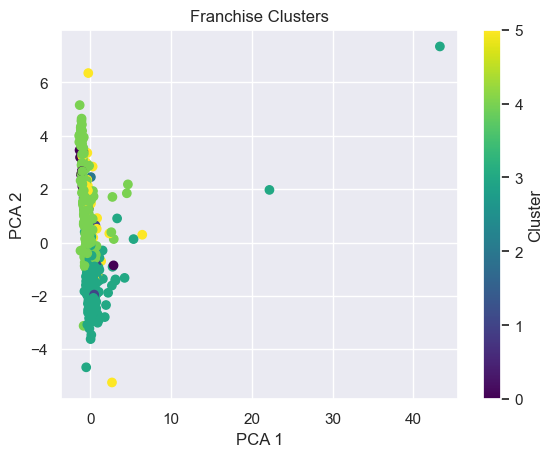

In [43]:
KNN_data = get_franchise_data(franchise_df)
KNN_data_no_na = KNN_data.dropna(subset=['ratio_rb'])

# genre vecotrization
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(tokenizer=lambda x: x.split(", "))
genre_matrix = vectorizer.fit_transform(KNN_data['genres'])
genre_df = pd.DataFrame(genre_matrix.toarray(), columns=[f'genre_{col}' for col in vectorizer.get_feature_names_out()])
KNN_data = pd.concat([KNN_data, genre_df], axis=1)

vectorizer = CountVectorizer(tokenizer=lambda x: x.split(", "))
country_matrix = vectorizer.fit_transform(KNN_data['country'])
country_df = pd.DataFrame(country_matrix.toarray(), columns=[f'country_{col}' for col in vectorizer.get_feature_names_out()])
KNN_data = pd.concat([KNN_data, country_df], axis=1)

# Separate the franchise with a ratio of revenue over budget and the ones that don't
KNN_data_no_na = KNN_data.dropna(subset=['ratio_rb'])
KNN_data_na = KNN_data[KNN_data['ratio_rb'].isna()]

# Load and preprocess dat
data = KNN_data_no_na.drop(columns=['collection_id','collection_name','genres','oldest_release','newest_release','franchise_length','country','region'])


scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)

# Apply K-Means
kmeans = KMeans(n_clusters=6, random_state=RANDOM_STATE)
clusters = kmeans.fit_predict(scaled_data)

# Assign clusters back to franchise_data_df
KNN_data_no_na.loc[:, 'Cluster'] = pd.NA  # Initialize Cluster column with NaN
KNN_data_no_na.loc[data.index, 'Cluster'] = clusters

    
# Dimensionality reduction for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(scaled_data)
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=clusters, cmap='viridis')
plt.title('Franchise Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.colorbar(label='Cluster')
plt.show()

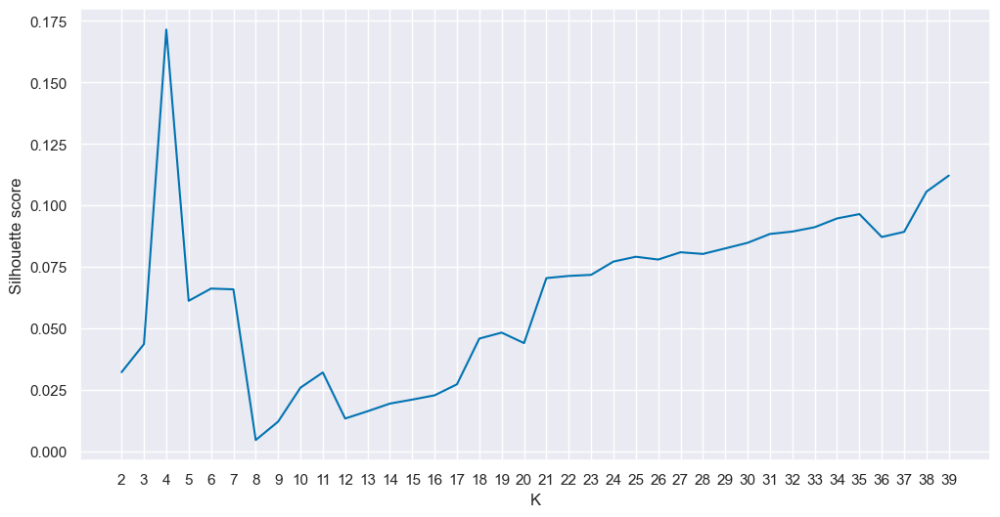

In [44]:
from sklearn.metrics import silhouette_score
silhouettes = []

# Try multiple k
for k in range(2, 40):
    # Cluster the data and assigne the labels
    clusters = KMeans(n_clusters=k, random_state=42,n_init='auto').fit_predict(scaled_data)
    # Get the Silhouette score
    score = silhouette_score(scaled_data, clusters)
    silhouettes.append({"k": k, "score": score})
    
# Convert to dataframe
silhouettes = pd.DataFrame(silhouettes)

# Plot the data
plt.figure(figsize=(12, 6))
plt.plot(silhouettes.k, silhouettes.score)
plt.xlabel("K")
plt.ylabel("Silhouette score")
plt.xticks(range(2, 40))
plt.show()

### Visualization of what the cluster looks like

Franchise of the cluster of less than 10 movies:
     Cluster                          collection_name
1294       1                         Laughing Gor（系列）
30         1  Teenage Mutant Ninja Turtles Collection
898        1                     Overheard Collection
595        1              The Storm Riders Collection
228        1                 Shanghai Noon Collection
238        1                        Ip Man Collection
388        1                Cannonball Run Collection
986        1                   Sex And Zen Collection
316        1                     Rush Hour Collection
663        2                   The Howling Collection
2          2         The Lord of the Rings Collection
273        2               Fortress (1992) Collection
83         2              Crocodile Dundee Collection
76         2                       Mad Max Collection
40         2                    Underworld Collection
356        2                     Boogeyman Collection
312        2      The Man From Sn

KeyboardInterrupt: 

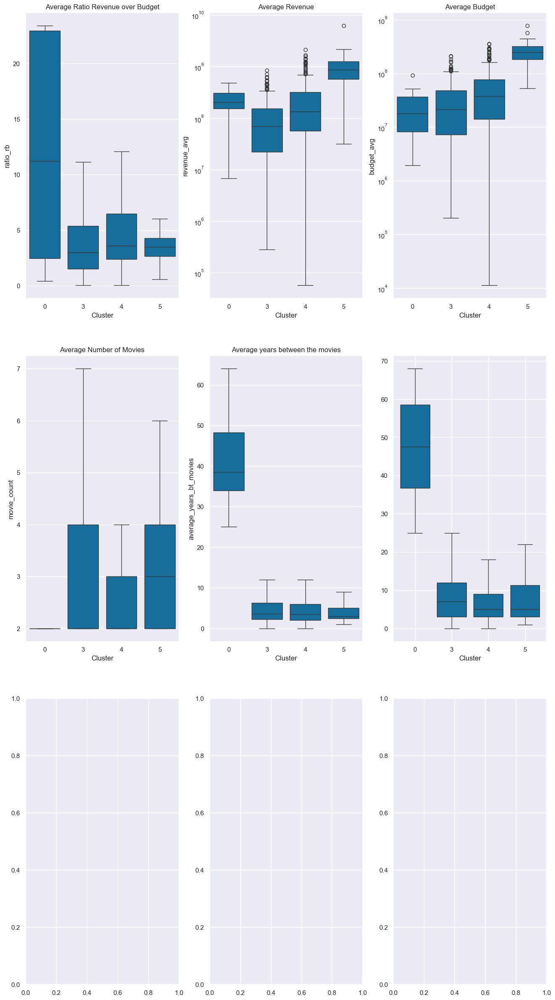

In [45]:
# Drop the cluster with less than 10 franchises idk if it is necessary
KNN_data_filt = KNN_data_no_na.groupby('Cluster').filter(lambda x: len(x) >= 10)


# Print the small cluster
print("Franchise of the cluster of less than 10 movies:")
print(KNN_data_no_na[~KNN_data_no_na['Cluster'].isin(KNN_data_no_na.groupby('Cluster').filter(lambda x: len(x) >= 10)['Cluster'])][['Cluster','collection_name']].sort_values(by='Cluster'))


fig, axs = plt.subplots(3, 3, figsize=(16, 30))


sns.boxplot(x='Cluster', y='ratio_rb', data=KNN_data_filt,showfliers=False, ax=axs[0,0])
axs[0,0].set_title('Average Ratio Revenue over Budget')
sns.boxplot(x='Cluster', y='revenue_avg', data=KNN_data_filt, ax=axs[0,1])
axs[0,1].set_title('Average Revenue')
axs[0,1].set_yscale('log')

sns.boxplot(x='Cluster', y='budget_avg', data=KNN_data_filt, ax=axs[0,2])
axs[0,2].set_title('Average Budget')
axs[0,2].set_yscale('log')

sns.boxplot(x='Cluster', y='movie_count', data=KNN_data_filt,showfliers=False, ax=axs[1,0])
axs[1,0].set_title('Average Number of Movies')
sns.boxplot(x='Cluster', y='average_years_bt_movies', data=KNN_data_filt,showfliers=False, ax=axs[1,1])
axs[1,1].set_title('Average years between the movies')


sns.boxplot(x='Cluster', y='franchise_length_years', data=KNN_data_filt,showfliers=False, ax=axs[1,2])
axs[1,2].set_title('Average Franchise Length (Years)')
sns.barplot(x=KNN_data_no_na['Cluster'].value_counts().index, y=KNN_data_no_na['Cluster'].value_counts().values, ax=axs[2,0])
axs[2,0].set_title('Number of Franchises per Cluster')
sns.boxplot(x='Cluster', y='runtime_avg', data=KNN_data_filt, ax=axs[2,1])
axs[2,1].set_title('Average Runtime')
sns.boxplot(x='Cluster', y='average_score', data=KNN_data_filt, ax=axs[2,2])
axs[2,2].set_title('Average Score')
axs[2,2].set_ylim(0, 10)

plt.tight_layout()
plt.show()



By doing different number of cluster we quickly observe that it can pretty easily make 4 clusters with a lot of franchises, the James Bonds' franchise is always alone and there are some other outliers that varies slightly when the number of cluster is increase, but 6 clusters made interesting results, so we're going to stick with that. 

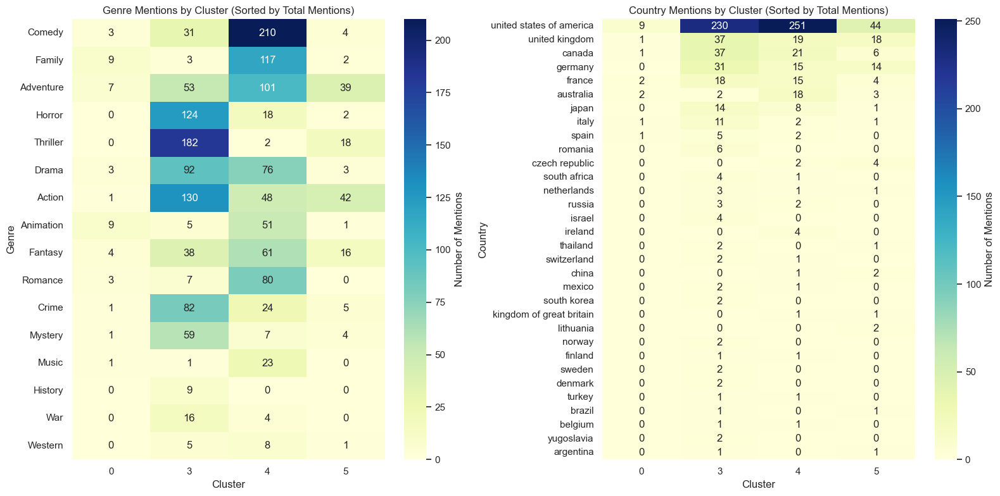

In [47]:
# Summing country mentions by cluster
country_sums = KNN_data_filt.groupby('Cluster')[
    [col for col in KNN_data_filt.columns if col.startswith('country_')]
].sum()

# Remove the 'country_' prefix from the column names
country_sums.columns = country_sums.columns.str.replace('country_', '')

# Sort countries by total mentions (sum across clusters)
country_sums = country_sums.loc[:, country_sums.sum().sort_values(ascending=False).index]
# remove the country that are mentionned only once
country_sums = country_sums.loc[:, country_sums.sum() > 1]


# Summing genre mentions by cluster
genre_sums = KNN_data_filt.groupby('Cluster')[
    [col for col in KNN_data_filt.columns if col.startswith('genre_')]
].sum()

# Remove the 'genre_' prefix from the column names
genre_sums.columns = genre_sums.columns.str.replace('genre_', '')

# put a capital letter at the beginning of the genre
genre_sums.columns = genre_sums.columns.str.capitalize()

# manually sorting the row to make the heatmap more readable
genre_sums = genre_sums.loc[:, ['Comedy', 'Family', 'Adventure', 'Horror', 'Thriller', 'Drama', 'Action', 'Animation', 'Fantasy', 'Romance', 'Crime', 'Mystery', 'Music', 'History', 'War', 'Western']]



# Plot the heatmap
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
sns.heatmap(
    genre_sums.T, 
    annot=True, 
    cmap='YlGnBu', 
    fmt='g', 
    cbar_kws={'label': 'Number of Mentions'},
    ax=axs[0]
)
axs[0].set_title('Genre Mentions by Cluster (Sorted by Total Mentions)')
axs[0].set_xlabel('Cluster')
axs[0].set_ylabel('Genre')

sns.heatmap(
    country_sums.T, 
    annot=True, 
    cmap='YlGnBu', 
    fmt='g', 
    cbar_kws={'label': 'Number of Mentions'},
    ax=axs[1]
)
axs[1].set_title('Country Mentions by Cluster (Sorted by Total Mentions)')
axs[1].set_xlabel('Cluster')
axs[1].set_ylabel('Country')
plt.tight_layout()
plt.show()



### Summary by cluster

Cluster 1:

In [48]:
KNN_data_no_na[KNN_data_no_na['Cluster']==0]['collection_name']

218                          Cinderella Collection
219                           Peter Pan Collection
220                            Fantasia Collection
293                               Bambi Collection
361                     The Jungle Book Collection
362                  Lady and the Tramp Collection
380           101 Dalmatians (Animated) Collection
382               The Fox and the Hound Collection
1199                                 Oz Collection
1487    Arsène Lupin (Robert Lamoureux) Collection
Name: collection_name, dtype: object

This cluster is the cluster of the musical, mostly produces by the United States, they have a pretty good ratio of budget over revenues, and they never have more that 3-4 movies.

Cluster 2:

In [49]:
KNN_data_no_na[KNN_data_no_na['Cluster']==1]['collection_name']

30      Teenage Mutant Ninja Turtles Collection
228                    Shanghai Noon Collection
238                           Ip Man Collection
316                        Rush Hour Collection
388                   Cannonball Run Collection
595                 The Storm Riders Collection
898                        Overheard Collection
986                      Sex And Zen Collection
1294                           Laughing Gor（系列）
Name: collection_name, dtype: object

The second cluster is the James Bond one, it is a big outlier that was already noticed previously and confirm again. It looks like no other franchise can be compared to it. It is around 25 movies that have been produced in 45 years, so around a movie each 2 years, and it has an average revenue that is big compared to other franchise. I think what makes this franchise unique is that its timeless.

Cluster 3:

In [50]:
KNN_data_no_na[KNN_data_no_na['Cluster']==2]['collection_name']

2         The Lord of the Rings Collection
40                   Underworld Collection
76                      Mad Max Collection
83             Crocodile Dundee Collection
273             Fortress (1992) Collection
312    The Man From Snowy River Collection
356                   Boogeyman Collection
663                 The Howling Collection
Name: collection_name, dtype: object

This is the other cluster with outliers, I personally never heard of those movies, but it looks like it got excellent review on tmbd and the movie runtime is longer than average. We also observe that one of those two franchise must have not really work out in the end since a ratio of revenue over budget is pretty low.

Cluster 4:

In [51]:
pd.set_option('display.max_rows', 500)  # Set a higher row limit
KNN_data_filt[KNN_data_filt['Cluster'] == 3]['collection_name'].head()

4     Star Trek: The Original Series Collection
5                      The Godfather Collection
9                            Ocean's Collection
11                          Predator Collection
13                              Cube Collection
Name: collection_name, dtype: object

This is one of the first really big cluster, it looks like its mostly teenage movies, animated movies, disneys and family sitcom. The main genre is comedy and 

Cluster 5:

In [52]:
KNN_data_filt[KNN_data_filt['Cluster'] == 4]['collection_name'].head()

7     Back to the Future Collection
25         Austin Powers Collection
29                 Rocky Collection
35             Evil Dead Collection
38                 Shrek Collection
Name: collection_name, dtype: object

This cluster looks like its mostly action movies and blockbuster hence it is also the pretty high budget franchise.

cluster 6:

In [53]:
KNN_data_filt[KNN_data_filt['Cluster'] == 5]['collection_name'].head()

0                    Star Wars Collection
1                Indiana Jones Collection
6              The Dark Knight Collection
8     Pirates of the Caribbean Collection
10               Jurassic Park Collection
Name: collection_name, dtype: object

This cluster is the clusters of the horror and thrillers movies, we can see that it has most of the time smaller budget but can have a ratio that can be really high depending on the franchise.

To conclude this part it looks like the pattern we were looking for is kind of hard to define, it looks like the cluster have mostly been separated by their genre which looks like its link to the average budget of the franchise. We were thinking that the successfulness of a franchise could be seen in the ratio of the revenue over the budget, but the results don't give a clear answer. There must still be features of franchise that would define better their successfulness, but we don't have them, that's why there's a big variance in the ratios.

It also looks like analyzing the franchise has a whole makes it difficult to quantify what is going to make a good franchise because the success inside a franchise can vary a lot that's why in the next part we're going to look at the interaction between the first a second and how from a first movie that work pretty well make another successful movie or a successful franchise,

## KNN regression of the first and second movie of the franchise (that both have values for budget and revenue)

In this part we're going to try to look more specificly on how does the first and second movie interact and which common behaviour of the first movie impacts the second movie.

After some trial and errors, the KNN couldn't really separate the franchise where the 2nd movie performs better than the first one, so to make it more relevant for our analysis, we first separate the franchise where the ratio (revenue over budget) has increase from the first movie or has decreased

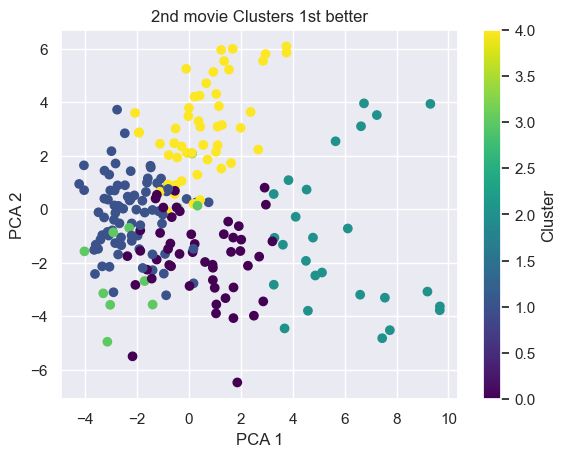

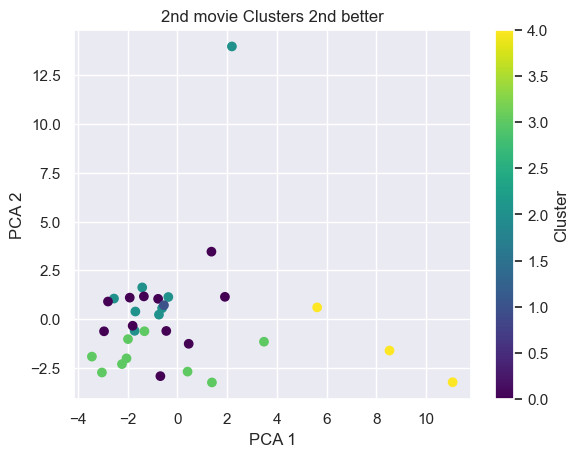

In [54]:
KNN_1_2 = get_1_2_movies(franchise_df)
KNN_1_2 = KNN_1_2.dropna(subset=['real_profit_1','real_profit_2'])
KNN_1_2 = KNN_1_2.drop(columns=['num_Asian_1','num_Asian_2','num_Black_1','num_Black_2','num_Hispanic_1','num_Hispanic_2','num_Middle Eastern_1','num_Middle Eastern_2','num_White_1','num_White_2','num_Native American_1','num_Native American_2','num_Others_1','num_Others_2','female_ratio_1','female_ratio_2'])
# seprate the franchise where the 2nd movie has a higher ratio than the first one
KNN_1_2_2ndbetter=KNN_1_2[KNN_1_2['ratio_revenue_budget_2'] > KNN_1_2['ratio_revenue_budget_1']]
KNN_1_2_1stbetter=KNN_1_2[KNN_1_2['ratio_revenue_budget_2'] <= KNN_1_2['ratio_revenue_budget_1']]

# Load and preprocess dat
#data = KNN_1_2_other.drop(columns=['collection_id','Wikipedia movie ID_1','Wikipedia movie ID_2','Movie name_1','Movie name_2','collection_name_1','collection_name_2','genres_1','genres_2','tmdb_origin_country_1','tmdb_origin_country_2'])

data = KNN_1_2_1stbetter.drop(columns=['collection_id','Wikipedia movie ID_1','Wikipedia movie ID_2','Movie name_1','Movie name_2','collection_name_1','collection_name_2','genres_1','genres_2','tmdb_origin_country_1','tmdb_origin_country_2'])

scaler = StandardScaler()
scaled_data_1st = scaler.fit_transform(data)


# Apply K-Means
kmeans = KMeans(n_clusters=5, random_state=RANDOM_STATE, n_init='auto')
clusters = kmeans.fit_predict(scaled_data_1st)

# Assign clusters back to franchise_data_df
KNN_1_2['Cluster'] = pd.NA  # Initialize Cluster column with NaN
KNN_1_2.loc[data.index, 'Cluster'] = clusters
    
# Dimensionality reduction for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(scaled_data_1st)
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=clusters, cmap='viridis')
plt.title('2nd movie Clusters 1st better')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.colorbar(label='Cluster')
plt.show()

# Load and preprocess dat
data = KNN_1_2_2ndbetter.drop(columns=['collection_id','Wikipedia movie ID_1','Wikipedia movie ID_2','Movie name_1','Movie name_2','collection_name_1','collection_name_2','genres_1','genres_2','tmdb_origin_country_1','tmdb_origin_country_2'])


scaler = StandardScaler()
scaled_data_2nd = scaler.fit_transform(data)

# Apply K-Means
kmeans = KMeans(n_clusters=5, random_state=RANDOM_STATE,n_init='auto')
clusters = kmeans.fit_predict(scaled_data_2nd)

# Assign clusters back to franchise_data_df
KNN_1_2.loc[data.index, 'Cluster'] = -clusters-1
    
# Dimensionality reduction for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(scaled_data_2nd)
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=clusters, cmap='viridis')
plt.title('2nd movie Clusters 2nd better')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.colorbar(label='Cluster')
plt.show()


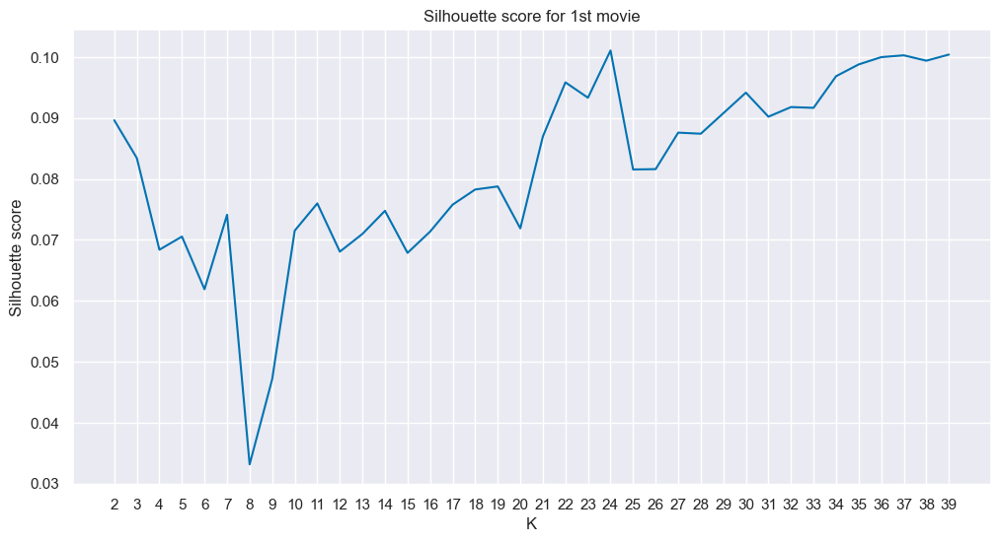

In [55]:
silhouettes = []

# Try multiple k
for k in range(2, 40):
    # Cluster the data and assigne the labels
    clusters = KMeans(n_clusters=k, random_state=42,n_init='auto').fit_predict(scaled_data_1st)
    # Get the Silhouette score
    score = silhouette_score(scaled_data_1st, clusters)
    silhouettes.append({"k": k, "score": score})
    
# Convert to dataframe
silhouettes = pd.DataFrame(silhouettes)

# Plot the data
plt.figure(figsize=(12, 6))
plt.title('Silhouette score for 1st movie')
plt.plot(silhouettes.k, silhouettes.score)
plt.xlabel("K")
plt.ylabel("Silhouette score")
plt.xticks(range(2, 40))
plt.show()

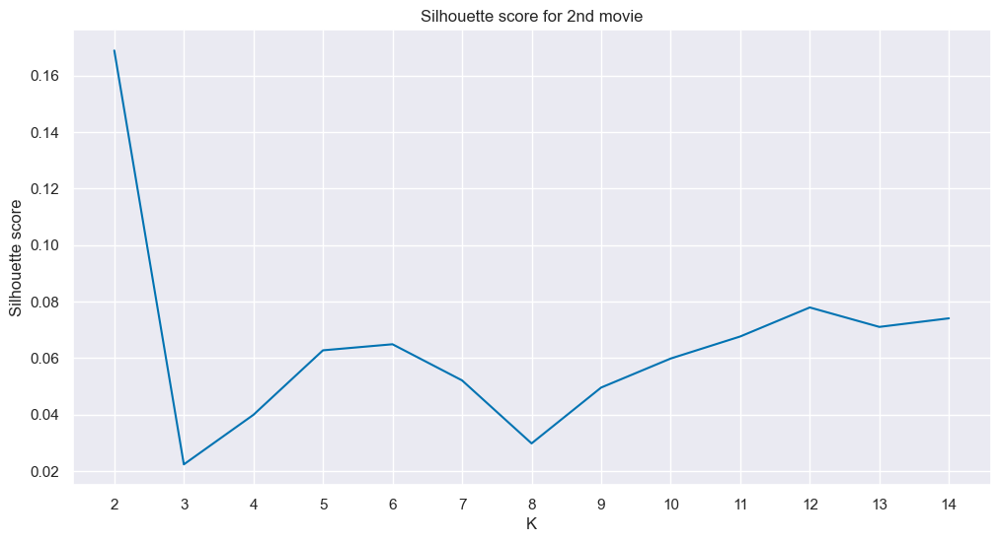

In [56]:
silhouettes = []

# Try multiple k
for k in range(2, 15):
    # Cluster the data and assigne the labels
    clusters = KMeans(n_clusters=k, random_state=42,n_init='auto').fit_predict(scaled_data_2nd)
    # Get the Silhouette score
    score = silhouette_score(scaled_data_2nd, clusters)
    silhouettes.append({"k": k, "score": score})
    
# Convert to dataframe
silhouettes = pd.DataFrame(silhouettes)

# Plot the data
plt.figure(figsize=(12, 6))
plt.title('Silhouette score for 2nd movie')
plt.plot(silhouettes.k, silhouettes.score)
plt.xlabel("K")
plt.ylabel("Silhouette score")
plt.xticks(range(2, 15))
plt.show()

Using the silouhette function we found that 5 is a good number of clusters for both and it's not creating too many cluster with a little number of franchise

### Visualization of what the cluster looks like

Franchise of the cluster of less than 10 movies:
    Cluster                     collection_name_1  \
2        -5      The Lord of the Rings Collection   
6        -5            The Dark Knight Collection   
26       -5               Harry Potter Collection   
815      -2  Clint Eastwood's Iwo Jima Collection   

                                          Movie name_1  \
2    The Lord of the Rings: The Fellowship of the Ring   
6                                        Batman Begins   
26            Harry Potter and the Philosopher's Stone   
815                               Flags of Our Fathers   

                                Movie name_2  
2      The Lord of the Rings: The Two Towers  
6                            The Dark Knight  
26   Harry Potter and the Chamber of Secrets  
815                    Letters from Iwo Jima  
Note that strictly negative cluster are the ones where the 2nd movie is better than the first one, positive cluster are the opposite


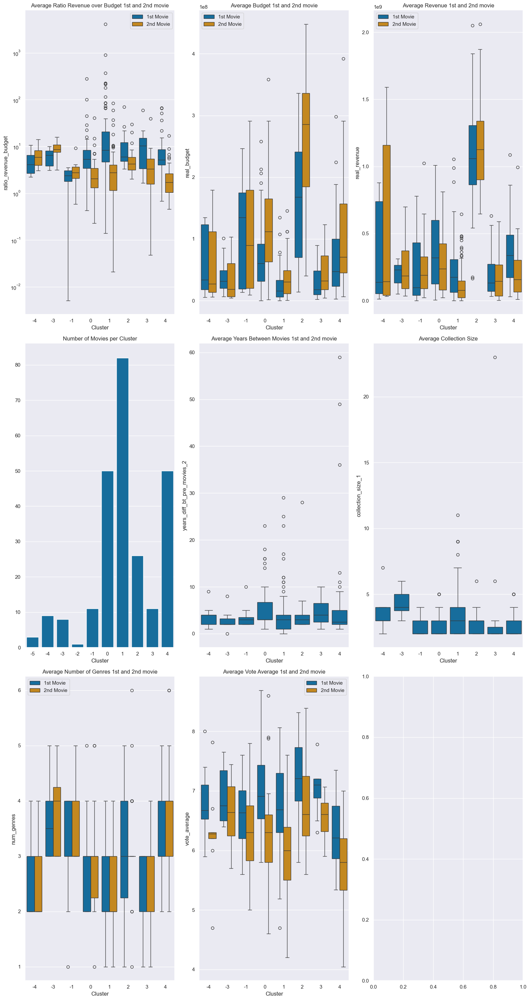

In [57]:
# Drop the cluster with less than 10 franchises idk if it is necessary
KNN_1_2_filt = KNN_1_2.groupby('Cluster').filter(lambda x: len(x) >= 5)

# Print the small cluster
print("Franchise of the cluster of less than 10 movies:")
print(KNN_1_2[~KNN_1_2['Cluster'].isin(KNN_1_2.groupby('Cluster').filter(lambda x: len(x) >= 5)['Cluster'])][['Cluster','collection_name_1','Movie name_1','Movie name_2']].sort_values(by='Cluster'))

print('Note that strictly negative cluster are the ones where the 2nd movie is better than the first one, positive cluster are the opposite')
fig, axs = plt.subplots(3, 3, figsize=(16, 30))


data_long = pd.melt(KNN_1_2_filt, id_vars='Cluster', value_vars=['ratio_revenue_budget_1', 'ratio_revenue_budget_2'],var_name='movie_nb', value_name='ratio_revenue_budget')
data_long['movie_nb']=data_long['movie_nb'].replace({'ratio_revenue_budget_1': '1st Movie', 'ratio_revenue_budget_2': '2nd Movie'})
sns.boxplot(data=data_long, x='Cluster', y='ratio_revenue_budget', hue='movie_nb', ax=axs[0,0])
axs[0,0].legend()
axs[0,0].set_title('Average Ratio Revenue over Budget 1st and 2nd movie')
axs[0,0].set_yscale('log')

data_long = pd.melt(KNN_1_2_filt, id_vars='Cluster', value_vars=['real_budget_1', 'real_budget_2'],var_name='movie_nb', value_name='real_budget')
data_long['movie_nb']=data_long['movie_nb'].replace({'real_budget_1': '1st Movie', 'real_budget_2': '2nd Movie'})
sns.boxplot(data=data_long, x='Cluster', y='real_budget', hue='movie_nb', ax=axs[0,1])
axs[0,1].legend()
axs[0,1].set_title('Average Budget 1st and 2nd movie')

data_long = pd.melt(KNN_1_2_filt, id_vars='Cluster', value_vars=['real_revenue_1', 'real_revenue_2'],var_name='movie_nb', value_name='real_revenue')
data_long['movie_nb']=data_long['movie_nb'].replace({'real_revenue_1': '1st Movie', 'real_revenue_2': '2nd Movie'})
sns.boxplot(data=data_long, x='Cluster', y='real_revenue', hue='movie_nb', ax=axs[0,2])
axs[0,2].legend()
axs[0,2].set_title('Average Revenue 1st and 2nd movie')


sns.barplot(x=KNN_1_2['Cluster'].value_counts().index, y=KNN_1_2['Cluster'].value_counts().values, ax=axs[1,0])
axs[1,0].set_title('Number of Movies per Cluster')

sns.boxplot(x='Cluster', y='years_diff_bt_pre_movies_2', data=KNN_1_2_filt, ax=axs[1,1])
axs[1,1].set_title('Average Years Between Movies 1st and 2nd movie')

sns.boxplot(x='Cluster', y='collection_size_1', data=KNN_1_2_filt, ax=axs[1,2])
axs[1,2].set_title('Average Collection Size')


data_long = pd.melt(KNN_1_2_filt, id_vars='Cluster', value_vars=['num_genres_1', 'num_genres_2'],var_name='movie_nb', value_name='num_genres')
data_long['movie_nb']=data_long['movie_nb'].replace({'num_genres_1': '1st Movie', 'num_genres_2': '2nd Movie'})
sns.boxplot(data=data_long, x='Cluster', y='num_genres', hue='movie_nb', ax=axs[2,0])
axs[2,0].legend()
axs[2,0].set_title('Average Number of Genres 1st and 2nd movie')

data_long = pd.melt(KNN_1_2_filt, id_vars='Cluster', value_vars=['vote_average_1', 'vote_average_2'],var_name='movie_nb', value_name='vote_average')
data_long['movie_nb']=data_long['movie_nb'].replace({'vote_average_1': '1st Movie', 'vote_average_2': '2nd Movie'})
sns.boxplot(data=data_long, x='Cluster', y='vote_average', hue='movie_nb', ax=axs[2,1])
axs[2,1].legend()
axs[2,1].set_title('Average Vote Average 1st and 2nd movie')

plt.tight_layout()
plt.show()



Text(15.749999999999988, 0.5, 'Genre')

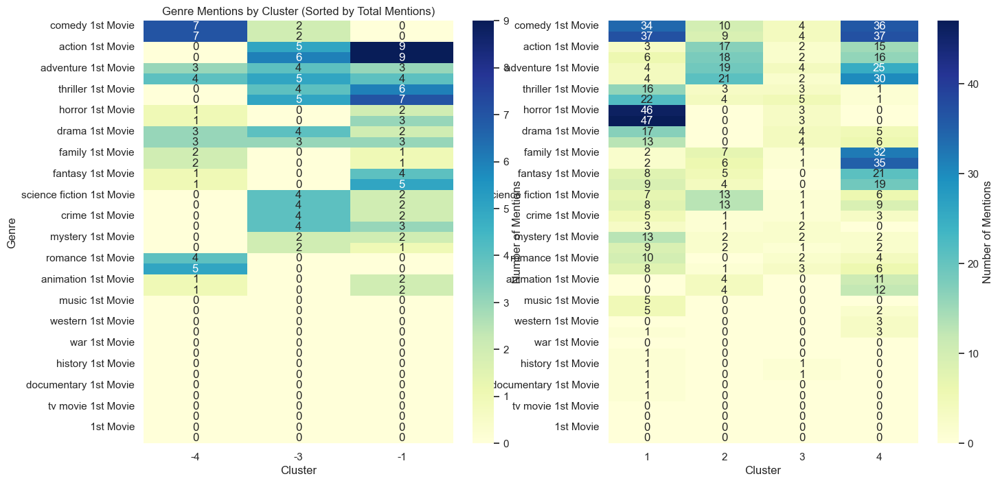

In [58]:
# Summing country of the 1st movie mentions by cluster
country_sums_1 = KNN_1_2_filt.groupby('Cluster')[
    [col for col in KNN_1_2_filt.columns if col.startswith('tmdb_origin_country_1_')]
].sum()

# Remove the 'country_' prefix from the column names
country_sums_1.columns = country_sums_1.columns.str.replace('tmdb_origin_country_1_', '')

# Sort countries by total mentions (sum across clusters)
country_sums_1 = country_sums_1.loc[:, country_sums_1.sum().sort_values(ascending=False).index]


# Summing country of the 2nd movie mentions by cluster
country_sums_2 = KNN_1_2_filt.groupby('Cluster')[
    [col for col in KNN_1_2_filt.columns if col.startswith('tmdb_origin_country_2_')]
].sum()

# Remove the 'country_' prefix from the column names
country_sums_2.columns = country_sums_2.columns.str.replace('tmdb_origin_country_2_', '')

# Sort countries by total mentions (sum across clusters)
country_sums_2 = country_sums_2.loc[:, country_sums_2.sum().sort_values(ascending=False).index]

# remove the country that are mentionned only once
country_sums_1 = country_sums_1.loc[:, country_sums_1.sum() > 1]
country_sums_2 = country_sums_2.loc[:, country_sums_2.sum() > 1]

for column in country_sums_1.columns:
    if column not in country_sums_2.columns:
        country_sums_2[column] = 0
country_sums_2 = country_sums_2[country_sums_1.columns]

# Interleave the columns (1st movie then 2nd movie for each cluster)
interleaved_columns = []
for cluster in country_sums_1.columns:
    interleaved_columns.append(country_sums_1[cluster].rename(f"{cluster} 1st Movie"))
    interleaved_columns.append(country_sums_2[cluster].rename(f"{cluster} 2nd Movie"))

# Combine into a single DataFrame
country_sums = pd.concat(interleaved_columns, axis=1)


# Summing genre mentions by cluster
genre_sums_1 = KNN_1_2_filt.groupby('Cluster')[
    [col for col in KNN_1_2_filt.columns if col.startswith('genre_1_')]
].sum()

# Remove the 'genre_' prefix from the column names
genre_sums_1.columns = genre_sums_1.columns.str.replace('genre_1_', '')

# Sort genres by total mentions (sum across clusters)
genre_sums_1 = genre_sums_1.loc[:, genre_sums_1.sum().sort_values(ascending=False).index]

# Summing genre mentions by cluster
genre_sums_2 = KNN_1_2_filt.groupby('Cluster')[
    [col for col in KNN_1_2_filt.columns if col.startswith('genre_2_')]
].sum()

# Remove the 'genre_' prefix from the column names
genre_sums_2.columns = genre_sums_2.columns.str.replace('genre_2_', '')

# Sort genres by total mentions (sum across clusters)
genre_sums_2 = genre_sums_2.loc[:, genre_sums_2.sum().sort_values(ascending=False).index]

# Interleave the columns (1st movie then 2nd movie for each cluster)
interleaved_columns = []
for cluster in genre_sums_1.columns:
    interleaved_columns.append(genre_sums_1[cluster].rename(f"{cluster} 1st Movie"))
    interleaved_columns.append(genre_sums_2[cluster].rename(f"{cluster} 2nd Movie"))

# Combine into a single DataFrame
genre_sums = pd.concat(interleaved_columns, axis=1)

# separate the negative and positive cluster
genre_sums_neg = genre_sums.T.iloc[:,0:3]
genre_sums_pos = genre_sums.T.iloc[:,4:10]


# Plot the heatmap
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
sns.heatmap(
    genre_sums_neg, 
    annot=True, 
    cmap='YlGnBu', 
    fmt='g', 
    cbar_kws={'label': 'Number of Mentions'},
    ax=axs[0]
)
axs[0].set_title('Genre Mentions by Cluster (Sorted by Total Mentions)')
axs[0].set_xlabel('Cluster')
axs[0].set_ylabel('Genre')

sns.heatmap(
    genre_sums_pos, 
    annot=True, 
    cmap='YlGnBu', 
    fmt='g', 
    cbar_kws={'label': 'Number of Mentions'},
    ax=axs[1]
)
axs[0].set_title('Genre Mentions by Cluster (Sorted by Total Mentions)')
axs[0].set_xlabel('Cluster')
axs[0].set_ylabel('Genre')


### Summary by cluster

Cluster -4:

In [59]:
KNN_1_2[KNN_1_2['Cluster']==-4][['collection_name_1','Movie name_1','Movie name_2']]

,collection_name_1,Movie name_1,Movie name_2
63,Ice Age Collection,Ice Age,Ice Age: The Meltdown
153,Harold & Kumar Collection,Harold & Kumar Go to White Castle,Harold & Kumar Escape from Guantanamo Bay
160,The Twilight Collection,Twilight,New Moon
204,Meet the Parents Collection,Meet the Parents,Meet the Fockers
425,Creepshow Collection,Creepshow,Creepshow 2
432,National Lampoon's Vacation Collection,Vacation,National Lampoon's European Vacation
505,Before... Collection,Before Sunrise,Before Sunset
776,Daddy Day Camp Collection,Daddy Day Care,Daddy Day Camp
1151,Madea Collection,Diary of a Mad Black Woman,Tyler Perry's Madea's Family Reunion


Those are the high budget franchise that didnt had a increase in budget for the second movie and 

Cluster -3:

In [60]:
KNN_1_2[KNN_1_2['Cluster']==-3][['collection_name_1','Movie name_1','Movie name_2']]

,collection_name_1,Movie name_1,Movie name_2
4,Star Trek: The Original Series Collection,Star Trek: The Motion Picture,Star Trek II: The Wrath of Khan
24,Lethal Weapon Collection,Lethal Weapon,Lethal Weapon 2
25,Austin Powers Collection,Austin Powers: International Man of Mystery,Austin Powers: The Spy Who Shagged Me
32,Planet of the Apes (Original) Collection,Planet of the Apes,Beneath the Planet of the Apes
128,Death Wish Collection,Death Wish,Death Wish II
150,The Millennium Collection,The Girl with the Dragon Tattoo,The Girl Who Played with Fire
161,Airport Collection,Airport,Airport 1975
457,Star Trek: The Next Generation Collection,Star Trek: Generations,Star Trek: First Contact


Cluster -2:

In [61]:
KNN_1_2[KNN_1_2['Cluster']==-2][['collection_name_1','Movie name_1','Movie name_2']]

,collection_name_1,Movie name_1,Movie name_2
815,Clint Eastwood's Iwo Jima Collection,Flags of Our Fathers,Letters from Iwo Jima


Cluster -1:

In [62]:
KNN_1_2[KNN_1_2['Cluster']==-1][['collection_name_1','Movie name_1','Movie name_2']]

,collection_name_1,Movie name_1,Movie name_2
51,World of Watches Collection,Night Watch,Day Watch
89,The Transporter Collection,The Transporter,Transporter 2
134,Hellboy Collection,Hellboy,Hellboy 2: The Golden Army
154,The Bourne Collection,The Bourne Identity,The Bourne Supremacy
212,National Treasure Collection,National Treasure,National Treasure: Book of Secrets
245,Arthur and the Invisibles Collection,Arthur and the Invisibles,Arthur and the Vengeance of Maltazard
287,The Boondock Saints Collection,The Boondock Saints,Boondock Saints II: All Saints Day
314,Ghost Rider Collection,Ghost Rider,Ghost Rider: Spirit of Vengeance
411,Firefly Collection,House of 1000 Corpses,The Devil's Rejects
460,AVP Collection,AVP: Alien vs. Predator,AVPR: Aliens vs Predator - Requiem


Cluster 1:

In [63]:
KNN_1_2[KNN_1_2['Cluster']==0][['collection_name_1','Movie name_1','Movie name_2']]

,collection_name_1,Movie name_1,Movie name_2
5,The Godfather Collection,The Godfather,The Godfather Part II
9,Ocean's Collection,Ocean's Eleven,Ocean's Twelve
11,Predator Collection,Predator,Predator 2
21,Blade Collection,Blade,Blade II
28,Die Hard Collection,Die Hard,Die Hard 2
31,Zorro Collection,The Mask of Zorro,The Legend of Zorro
40,Underworld Collection,Underworld,Underworld: Evolution
44,Tomb Raider Collection,Lara Croft: Tomb Raider,Lara Croft Tomb Raider: The Cradle of Life
47,The Chronicles of Riddick Collection,Pitch Black,The Chronicles of Riddick
49,Kill Bill Collection,Kill Bill Volume 1,Kill Bill Volume 2


Cluster 2:

In [64]:
KNN_1_2[KNN_1_2['Cluster']==1][['collection_name_1','Movie name_1','Movie name_2']]

,collection_name_1,Movie name_1,Movie name_2
20,Saw Collection,Saw,Saw II
29,Rocky Collection,Rocky,Rocky II
35,Evil Dead Collection,The Evil Dead,Evil Dead II
37,The Grudge Collection,The Grudge,The Grudge 2
42,Jaws Collection,Jaws,Jaws 2
45,Scream Collection,Scream,Scream 2
48,American Pie Collection,American Pie,American Pie 2
50,Ghostbusters Collection,Ghostbusters,Ghostbusters II
52,Ace Ventura Collection,Ace Ventura: Pet Detective,Ace Ventura: When Nature Calls
54,I Know What You Did Last Summer Collection,I Know What You Did Last Summer,I Still Know What You Did Last Summer


Cluster 3:

In [65]:
KNN_1_2[KNN_1_2['Cluster']==2][['collection_name_1','Movie name_1','Movie name_2']]

,collection_name_1,Movie name_1,Movie name_2
0,Star Wars Collection,Star Wars Episode IV: A New Hope,Star Wars Episode V: The Empire Strikes Back
1,Indiana Jones Collection,Indiana Jones and the Raiders of the Lost Ark,Indiana Jones and the Temple of Doom
7,Back to the Future Collection,Back to the Future,Back to the Future Part II
10,Jurassic Park Collection,Jurassic Park,The Lost World: Jurassic Park
16,The Terminator Collection,The Terminator,Terminator 2: Judgment Day
18,Spider-Man Collection,Spider-Man,Spider-Man 2
22,X-Men Collection,X-Men,X2
33,The Mummy Collection,The Mummy,The Mummy Returns
38,Shrek Collection,Shrek,Shrek 2
41,The Matrix Collection,The Matrix,The Matrix Reloaded


Cluster 4:

In [66]:
KNN_1_2[KNN_1_2['Cluster']==3][['collection_name_1','Movie name_1','Movie name_2']]

,collection_name_1,Movie name_1,Movie name_2
19,James Bond Collection,Dr. No,From Russia with Love
27,28 Days/Weeks Later Collection,28 Days Later,28 Weeks Later
34,USA: Land of Opportunities Collection,Dogville,Manderlay
75,Bridget Jones Collection,Bridget Jones's Diary,Bridget Jones: The Edge of Reason
242,[REC] Collection,REC,REC 2
266,Johnny English Collection,Johnny English,Johnny English Reborn
299,The Descent Collection,The Descent,The Descent 2
378,Elizabeth Collection,Elizabeth,Elizabeth: The Golden Age
398,Mr. Bean Collection,Bean,Mr. Bean's Holiday
782,Spanish Apartment Trilogy,Pot Luck,The Russian Dolls


Cluster 5:

In [67]:
KNN_1_2[KNN_1_2['Cluster']==4][['collection_name_1','Movie name_1','Movie name_2']]

,collection_name_1,Movie name_1,Movie name_2
30,Teenage Mutant Ninja Turtles Collection,Teenage Mutant Ninja Turtles,Teenage Mutant Ninja Turtles II: The Secret of...
53,Dr. Dolittle Collection,Dr. Dolittle,Dr. Dolittle 2
61,Highlander Collection,Highlander,Highlander II: The Quickening
66,The Karate Kid Collection,The Karate Kid,"The Karate Kid, Part II"
81,Free Willy Collection,Free Willy,Free Willy 2: The Adventure Home
82,Young Guns Collection,Young Guns,Young Guns II
83,Crocodile Dundee Collection,Crocodile Dundee,Crocodile Dundee II
86,Babe Collection,Babe,Babe: Pig in the City
95,Mortal Kombat Collection,Mortal Kombat,Mortal Kombat: Annihilation
117,Addams Family Collection,The Addams Family,Addams Family Values
